# Red and white 'vinho verde' wines
- The aim of this project is predict the quality of red and white portuguese wine based on their physicohemical properties.

In [1]:
# importing basic modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wine import histogram_boxplot, f_test_two_samples, replace_values, interquantile_range_calculator, test_models_metrics, best_classification_split_score
from pprint import pprint
import warnings

In [2]:
# importing statistics- and machine learning-related modules
from scipy import stats as sts
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score
from sklearn.inspection import permutation_importance
from mlxtend.plotting import plot_confusion_matrix
from xgboost import XGBClassifier
import shap

In [3]:
%matplotlib inline
warnings.filterwarnings('ignore')

In [4]:
## plot style
sns.set_style('darkgrid')

In [5]:
# loading datasets
df_red = pd.read_csv('winequality-red.csv', sep = ';')
df_white = pd.read_csv('winequality-white.csv', sep = ';')

In [6]:
# checking the load dataframes
df_red.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [7]:
df_white.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [8]:
# variables description
desc = {'Fixed acidity': 'g(tartaric acid)/L', 
        'Volatile acidity': 'g(acetic acid)/L', 
        'Citric acid': 'g(citric acid)/L (average amount for detection is 0.6 g/L)', 
        'Residual sugar': 'g(residual sugar)/L', 
        'Chlorides': 'g(sodium chloride)/L', 
        'Free sulfur dioxide': 'Free sulfur dioxide (mg/L)',
        'Total sulfur dioxide': 'Total sulfur dioxide (mg/L)',
        'Density': 'Density (g/mL)', 
        'pH': 'potential of hydrogen',
        'Sulphates': 'g(potassium sulphate)/L', 'Alcohol': 'percentage by volume'
}

desc = pd.Series(data = desc.values(), index = desc.keys())
desc

Fixed acidity                                          g(tartaric acid)/L
Volatile acidity                                         g(acetic acid)/L
Citric acid             g(citric acid)/L (average amount for detection...
Residual sugar                                        g(residual sugar)/L
Chlorides                                            g(sodium chloride)/L
Free sulfur dioxide                            Free sulfur dioxide (mg/L)
Total sulfur dioxide                          Total sulfur dioxide (mg/L)
Density                                                    Density (g/mL)
pH                                                  potential of hydrogen
Sulphates                                         g(potassium sulphate)/L
Alcohol                                              percentage by volume
dtype: object

---
## data concistency and cleaning

In [9]:
# information on red wine
df_red.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [10]:
df_white.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


**Comments:** There are no missing information in the datasets. However, data will be unbalanced if datasets are analyzed together.

---

##### duplicated information

In [11]:
# looking for duplicated data
print("Total of duplicated data in red whine dataset: ", df_red.duplicated().sum())
print("Total of duplicated data in white whine dataset: ", df_white.duplicated().sum())

Total of duplicated data in red whine dataset:  240
Total of duplicated data in white whine dataset:  937


In [12]:
# finding all duplicates in red wine dataset
df_red[df_red.duplicated(keep = False)]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5
11,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5
22,7.9,0.430,0.21,1.6,0.106,10.0,37.0,0.99660,3.17,0.91,9.5,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1567,7.2,0.695,0.13,2.0,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1579,6.2,0.560,0.09,1.7,0.053,24.0,32.0,0.99402,3.54,0.60,11.3,5
1581,6.2,0.560,0.09,1.7,0.053,24.0,32.0,0.99402,3.54,0.60,11.3,5
1592,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6


In [13]:
# dealing with duplicates in red wine dataset -> only the first appearance will be kept
df_red.drop_duplicates(keep = 'first', inplace = True)
df_red.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5


In [14]:
# dealing with duplicates in red wine dataset -> only the first appearance will be kept
df_white.drop_duplicates(keep = 'first', inplace = True)
df_white.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6


---

##### dealing with oultilers

In [15]:
# labelling datasets and join them together to understand outliers
df_red['label'] = 'red'
df_white['label'] = 'white'
df = pd.concat([df_red, df_white])

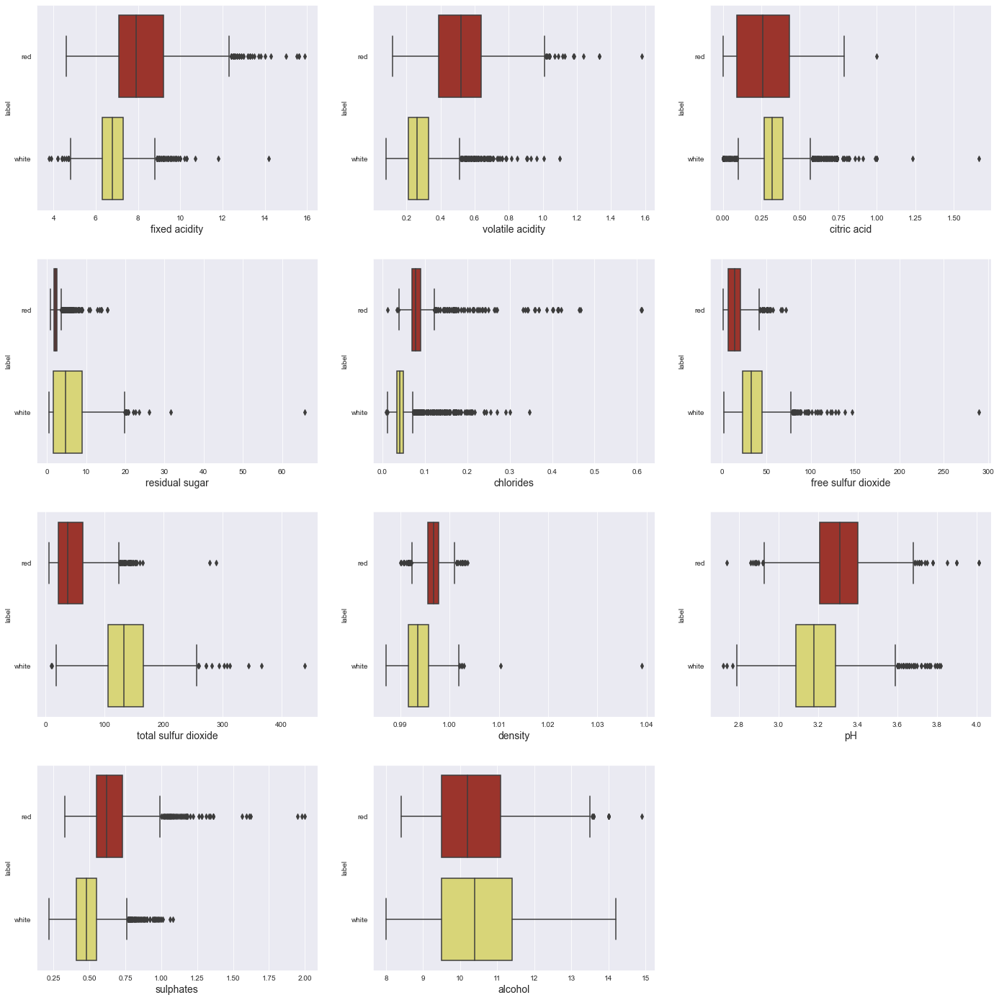

In [16]:
# selecting columns
columns = df_red.columns # all columns
index1, index2 = np.where(df_red.columns == 'quality'), np.where(df_red.columns == 'label') # unnecessary information
col = np.delete(columns, [index1, index2]) # only target columns

# evaluating distribution by box plot
## plot size
plt.figure(figsize = (20, 20))

## iteration
for pos, x in enumerate(col):
    plt.subplot(4, 3, (pos + 1))
    sns.boxplot(data = df, x = x, y = 'label', palette = ['#ad241a', '#e8e468'], whis = 1.5)
    #sns.histplot(data = df_red, x = x, color = '#ad241a', kde = True, stat = 'density')
    #sns.histplot(data = df_white, x = x, color = '#e8e468', kde = True, stat = 'density', alpha = 0.5)
    plt.xlabel(x, fontsize = 14)
                
plt.tight_layout(pad = 3.3) # increasing vertical distance between plots
plt.show()

**Comments:** There are a lot of outliers in this dataset, though some of them may make sense for Portuguese wines. Therefore, I will be very permissive and allow all values with up to 3 * IQR for both sides to remain in the dataset.

- red wines

In [17]:
# checking the whisker values for each feature except for quality and label
## selecting columns
del1, del2 = np.where(df_red.columns == 'quality'), np.where(df_red.columns == 'label')
col = np.delete(df_red.columns, [del1, del2])

## finding the inferior and superior whisker values for each variable
sw = []
iw = []

for c in col:
    swc = interquantile_range_calculator(df_red[c], factor=3)
    sw.append(swc[1])
    iw.append(swc[0])

# packing all information into a dataframe
sw = np.array(sw).reshape(-1, 1)
iw = np.array(iw).reshape(-1, 1)
np.hstack([iw, sw])
whiskers = pd.DataFrame(data = np.hstack([iw, sw]), columns = ['inferior_whisker', 'superior_whisker'], index = col)

In [18]:
whiskers

,inferior_whisker,superior_whisker
fixed acidity,0.80,15.50
volatile acidity,-0.36,1.39
citric acid,-0.93,1.45
residual sugar,-0.20,4.70
chlorides,0.01,0.15
free sulfur dioxide,-35.00,63.00
total sulfur dioxide,-101.00,186.00
density,0.99,1.00
pH,2.64,3.97
sulphates,0.01,1.27


In [19]:
# creating a copy of the original dataset to introduce changes
dfr = df_red.copy()

In [20]:
# replacement in the dataset of red wine all at once
for c in col:
    dfr = dfr[(dfr[c] >= whiskers.loc[c, 'inferior_whisker']) & (dfr[c] <= whiskers.loc[c, 'superior_whisker'])]

In [21]:
dfr.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,1175.0,8.166723,1.578963,4.60000,7.1000,7.80000,9.1000,13.800
volatile acidity,1175.0,0.528289,0.180875,0.12000,0.3900,0.52000,0.6400,1.330
citric acid,1175.0,0.254596,0.186193,0.00000,0.0800,0.24000,0.4000,0.750
residual sugar,1175.0,2.254553,0.578437,0.90000,1.9000,2.20000,2.5000,4.700
chlorides,1175.0,0.078778,0.016575,0.01200,0.0680,0.07800,0.0875,0.147
free sulfur dioxide,1175.0,15.760426,9.854686,1.00000,8.0000,14.00000,21.0000,57.000
total sulfur dioxide,1175.0,45.258298,30.954972,6.00000,22.0000,37.00000,60.0000,165.000
density,1175.0,0.996456,0.001660,0.99007,0.9955,0.99655,0.9976,1.000
pH,1175.0,3.321736,0.147219,2.88000,3.2200,3.32000,3.4100,3.900
sulphates,1175.0,0.639140,0.131295,0.33000,0.5500,0.61000,0.7100,1.220


- white wine

In [22]:
# checking the whisker values for each feature except for quality and label
## selecting columns
del1, del2 = np.where(df_white.columns == 'quality'), np.where(df_white.columns == 'label')
col = np.delete(df_white.columns, [del1, del2])

## finding the inferior and superior whisker values for each variable
sw = []
iw = []

for c in col:
    swc = interquantile_range_calculator(df_white[c], factor=3.0)
    sw.append(swc[1])
    iw.append(swc[0])

# packing all information into a dataframe
sw = np.array(sw).reshape(-1, 1)
iw = np.array(iw).reshape(-1, 1)
np.hstack([iw, sw])
whiskers = pd.DataFrame(data = np.hstack([iw, sw]), columns = ['inferior_whisker', 'superior_whisker'], index = col)
whiskers

,inferior_whisker,superior_whisker
fixed acidity,3.30,10.30
volatile acidity,-0.15,0.69
citric acid,-0.09,0.75
residual sugar,-20.30,30.80
chlorides,-0.01,0.10
free sulfur dioxide,-43.00,111.00
total sulfur dioxide,-74.00,346.00
density,0.98,1.01
pH,2.49,3.89
sulphates,-0.01,0.97


In [23]:
# creating a copy of the original dataset to introduce changes
dfw = df_white.copy()
# replacement in the dataset of red wine all at once
for c in col:
    dfw = dfw[(dfw[c] >= whiskers.loc[c, 'inferior_whisker']) & (dfw[c] <= whiskers.loc[c, 'superior_whisker'])]

In [24]:
dfw.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,3807.0,6.832204,0.850674,3.80000,6.30000,6.8000,7.3000,10.30000
volatile acidity,3807.0,0.276333,0.094945,0.08000,0.21000,0.2600,0.3200,0.69000
citric acid,3807.0,0.329892,0.111647,0.00000,0.27000,0.3200,0.3800,0.74000
residual sugar,3807.0,5.912530,4.750799,0.60000,1.60000,4.7000,8.9000,26.05000
chlorides,3807.0,0.042899,0.011616,0.00900,0.03500,0.0420,0.0490,0.09900
free sulfur dioxide,3807.0,34.547019,16.110264,2.00000,23.00000,33.0000,45.0000,110.00000
total sulfur dioxide,3807.0,136.568821,42.297466,9.00000,106.00000,132.0000,166.0000,344.00000
density,3807.0,0.993746,0.002813,0.98711,0.99158,0.9934,0.9957,1.00295
pH,3807.0,3.198353,0.151488,2.72000,3.10000,3.1900,3.2900,3.82000
sulphates,3807.0,0.489732,0.111337,0.22000,0.41000,0.4800,0.5500,0.97000


In [25]:
# remaining data
print("Number of remaining individuals in red wine dataset", dfr.shape[0])
print("Number of remaining individuals in red wine dataset", dfw.shape[0])

Number of remaining individuals in red wine dataset 1175
Number of remaining individuals in red wine dataset 3807


---
## Exploratory data analysis
### studying the relationship among features -> focus on features and target

##### red wine

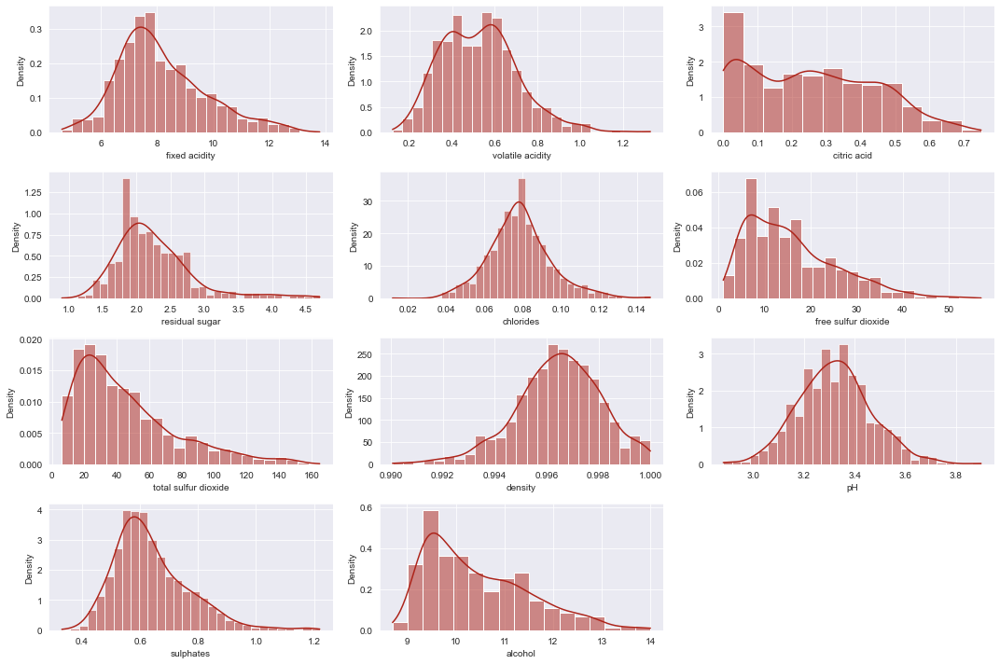

In [28]:
# target columns
del1, del2 = np.where(df_red.columns == 'quality'), np.where(df_red.columns == 'label')
col = np.delete(df_red.columns, [del1, del2])

# plotting
plt.figure(figsize = (15, 10))
for pos, c in enumerate(col):
    plt.subplot(4, 3, (pos + 1))
    sns.histplot(x = c,
                 data = dfr,
                 stat = 'density',
                 color = '#ad241a',
                 kde = True)
    
plt.tight_layout()
plt.show()

**Comments:** Fixed acidity, residual sugar, chlorides, density, pH and sulphates follows a normal distribution though with a certain degree of skewness. Volatile acidity has a bimodal distribution. The remaining follows other distributions.

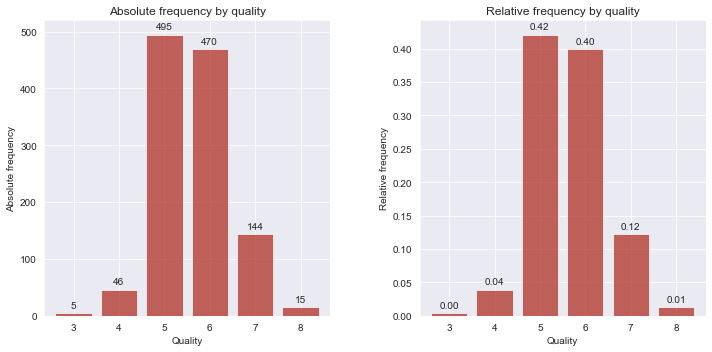

In [29]:
# analyzing the column quality of red wines
# figure size
plt.figure(figsize = (10, 5))

## absolute frequency
abs_freq = dfr['quality'].value_counts().sort_index()
xa = abs_freq.index
ya = abs_freq.values
ax1 = plt.subplot(121)
abs_freq.plot(kind = 'bar', color = '#ad241a', alpha = 0.7, width = 0.8, rot = 0, ax = ax1)
ax1.set_title('Absolute frequency by quality')
ax1.set_xlabel("Quality")
ax1.set_ylabel("Absolute frequency")
ax1.bar_label(ax1.containers[0], padding = 3) # mostrando os valores no topo das barras de vinho tinto

# relative frequency
rel_freq = dfr['quality'].value_counts(normalize = True).sort_index()
x = rel_freq.index
y = rel_freq.values
ax2 = plt.subplot(122)
rel_freq.plot(kind = 'bar', color = '#ad241a', alpha = 0.7, width = 0.8, rot = 0, ax = ax2)
ax2.set_title('Relative frequency by quality')
ax2.set_xlabel("Quality")
ax2.set_ylabel("Relative frequency")
ax2.bar_label(ax2.containers[0], padding = 3, fmt = '%.2f') # mostrando os valores no topo das barras de vinho tinto

plt.tight_layout(w_pad = 5)
plt.show()

**Comments:** The majority red wines were graded between 5 and 6.

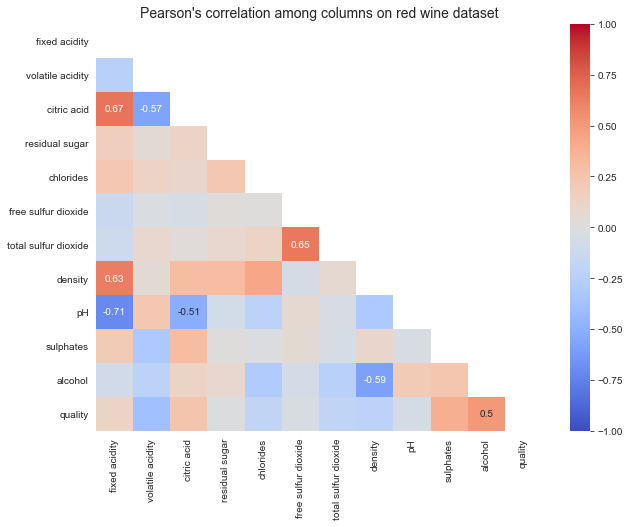

In [30]:
# selecting the columns that will be used
deletion = np.where(dfr.columns == 'label')
col = np.delete(dfr.columns, deletion)

# finding correlations
corr = dfr.corr(method='pearson').round(2) # round values to two floating points. Needed should fmt = ''

# plotting correlation
sns.set_style('white')
plt.figure(figsize = (10, 7.5))
sns.heatmap(data = corr,
            cmap = 'coolwarm',
            annot = corr.where(corr >= 0.5, corr.where(corr <= -0.5, '')), # conditional to show only correlations <= -0.5 or correlations >= 0.5
            vmin = -1,
            vmax = 1,
            mask = np.triu(corr.corr("pearson")),
            fmt = '') # necessary in case conditional is passed in and there is a string
plt.title("Pearson's correlation among columns on red wine dataset", fontsize = 14)
plt.show()

**Comments:** There are some moderate to strong correlation. They are:
- fixed acidity and citric acid (+), fixed acidity and density (+) and fixed acidity and pH (-)
- volatile acidity and citric acid (-)
- citric acid and pH (-)
- total sulfur dioxide and free sulfur dioxide (+)
- density and alcohol (-)
- alcohol and quality (+)

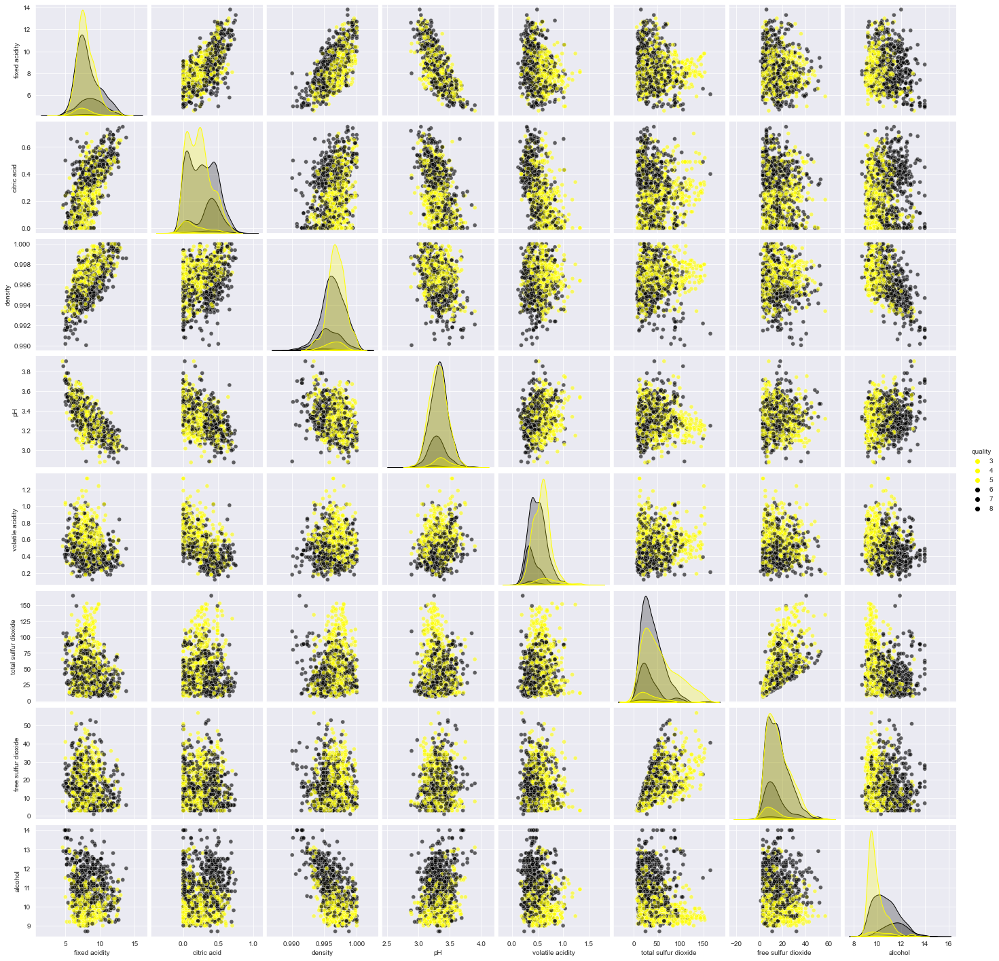

In [31]:
# pairplot for general comparison of only correlated variables
sns.set_style('darkgrid')
## selecting variables
dfr_selected = dfr[['fixed acidity', 'citric acid', 'density', 'pH', 'volatile acidity', 'total sulfur dioxide',
                    'free sulfur dioxide', 'alcohol', 'quality']]

## creating customized pairplot
palette_low = ['yellow'] * 3 # grades 3, 4 and 5 will be considered low quality wines
palette_high = ['black'] * 3 # grades 6, 7 and 8 will be considered high quality wines
sns.pairplot(data = dfr_selected, hue = 'quality', palette = palette_low + palette_high, plot_kws={'alpha': 0.6})
#plt.savefig('pairplot_red_quality.jpg', dpi = 300)
plt.show() #plot_kws={'line_kws':{'color':'red'}, 'scatter_kws': {'alpha': 0.1}})

**Comments:** When compared by original qualities, no clear pattern was seen. However, classification as low-quality (grades <= 5) and high-quality (grades >= 6) wines roughly separates the classes based on some features, such as alcohol level and total sulfur dioxide. An statistical analysis will be performed to evaluate variation and mean shift upon this new classification.

In [26]:
# creating the column for low- and high-quality wines
dfr.loc[dfr['quality'] <= 5, 'cat_quality'] = 'low'
dfr.loc[dfr['cat_quality'].isna(), 'cat_quality'] = 'high'

In [33]:
# checking
dfr['cat_quality'].unique()

array(['low', 'high'], dtype=object)

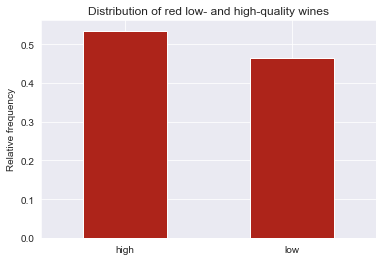

In [34]:
dfr['cat_quality'].value_counts(normalize = True).plot(kind = 'bar', rot = 0, color = '#ad241a')
plt.title("Distribution of red low- and high-quality wines")
plt.ylabel("Relative frequency")
plt.show()

In [35]:
# checking differences on alcoholic level of low- and high-quality wines
low_alcohol = dfr['alcohol'][dfr['cat_quality'] == 'low']
high_alcohol = dfr['alcohol'][dfr['cat_quality'] == 'high']

# evaluating the variances
## H0: var1 = var2 or var1 - var2 = 0 || H1: var1 != var2 or var1 - var2 != 0
## confidence interval = 0.90, two-tail test
_, _, p_value_f = f_test_two_samples(low_alcohol, high_alcohol)

# evaluating the means
## H0: mean1 = mean2 or mean1 - mean2 = 0 || H1: mean1 != mean2 or mean1 - mean2 != 0
## confidence interval = 0.95, two-tail test
if p_value_f < 0.05:
    _, p_value_t = sts.ttest_ind(low_alcohol, high_alcohol, equal_var = False)
else:
    _, p_value_t = sts.ttest_ind(low_alcohol, high_alcohol, equal_var = True)

print("Means statistically different?", p_value_t < 0.05)

Means statistically different? True


In [36]:
# checking differences on total sulfur dioxide level of low- and high-quality wines
low_alcohol = dfr['total sulfur dioxide'][dfr['cat_quality'] == 'low']
high_alcohol = dfr['total sulfur dioxide'][dfr['cat_quality'] == 'high']

# evaluating the variances
## H0: var1 = var2 or var1 - var2 = 0 || H1: var1 != var2 or var1 - var2 != 0
## confidence interval = 0.90, two-tail test
_, _, p_value_f = f_test_two_samples(low_alcohol, high_alcohol)

# evaluating the means
## H0: mean1 = mean2 or mean1 - mean2 = 0 || H1: mean1 != mean2 or mean1 - mean2 != 0
## confidence interval = 0.95, two-tail test
if p_value_f < 0.05:
    _, p_value_t = sts.ttest_ind(low_alcohol, high_alcohol, equal_var = False)
else:
    _, p_value_t = sts.ttest_ind(low_alcohol, high_alcohol, equal_var = True)

print("Means statistically different?", p_value_t < 0.05)

Means statistically different? True


##### white wine

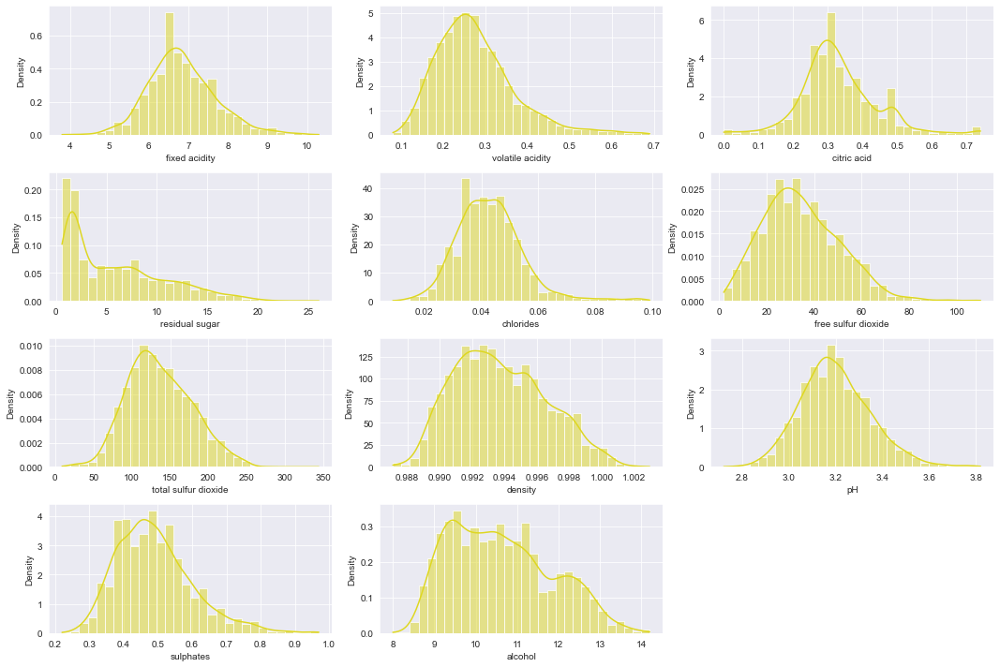

In [37]:
# target columns
del1, del2 = np.where(df_white.columns == 'quality'), np.where(df_white.columns == 'label')
col = np.delete(df_white.columns, [del1, del2])

# plotting
plt.figure(figsize = (15, 10))
for pos, c in enumerate(col):
    plt.subplot(4, 3, (pos + 1))
    sns.histplot(x = c,
                 data = dfw,
                 stat = 'density',
                 color = '#ded721',
                 kde = True,
                 bins = 30)
    
plt.tight_layout()
plt.show()

**Comments:** Excepting for residual sugar, chlorides, citric acid, density and alcohol, which follow unknown distributions, the other resembles the normal distribution with some degree of skewness.

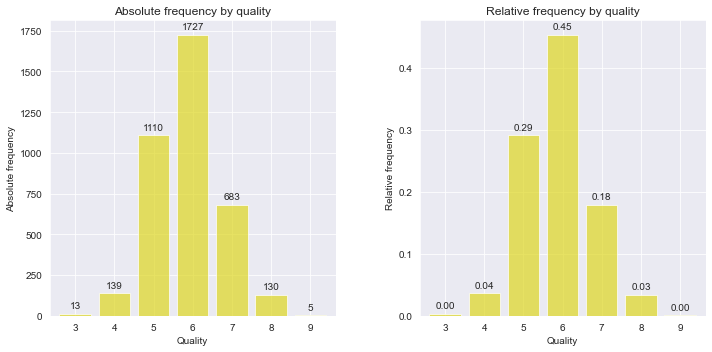

In [38]:
# analyzing the quality column of white wines
# figure size
plt.figure(figsize = (10, 5))

## absolute frequency
abs_freq = dfw['quality'].value_counts().sort_index()
xa = abs_freq.index
ya = abs_freq.values
ax1 = plt.subplot(121)
abs_freq.plot(kind = 'bar', color = '#ded721', alpha = 0.7, width = 0.8, rot = 0, ax = ax1)
ax1.set_title('Absolute frequency by quality')
ax1.set_xlabel("Quality")
ax1.set_ylabel("Absolute frequency")
ax1.bar_label(ax1.containers[0], padding = 3) # mostrando os valores no topo das barras de vinho tinto

# relative frequency
rel_freq = dfw['quality'].value_counts(normalize = True).sort_index()
x = rel_freq.index
y = rel_freq.values
ax2 = plt.subplot(122)
rel_freq.plot(kind = 'bar', color = '#ded721', alpha = 0.7, width = 0.8, rot = 0, ax = ax2)
ax2.set_title('Relative frequency by quality')
ax2.set_xlabel("Quality")
ax2.set_ylabel("Relative frequency")
ax2.bar_label(ax2.containers[0], padding = 3, fmt = '%.2f') # mostrando os valores no topo das barras de vinho tinto

plt.tight_layout(w_pad = 5)
plt.show()

**Comments:** White wine quality scores concentrates between 5, 6 and 7 grades.

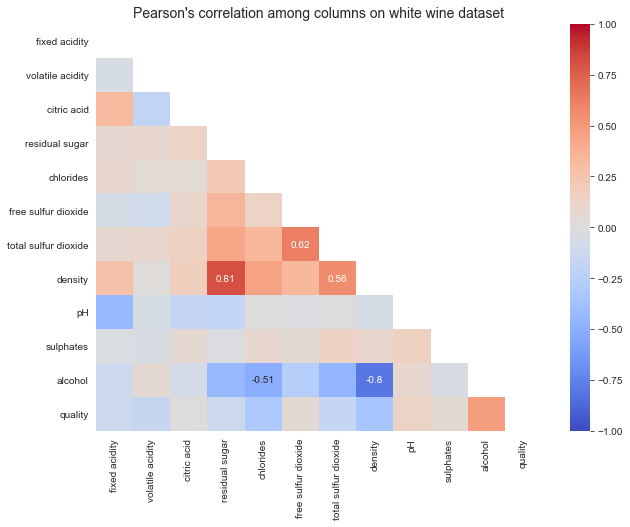

In [39]:
# selecting the columns that will be used
deletion = np.where(dfw.columns == 'label')
col = np.delete(dfw.columns, deletion)

# finding correlations
corr = dfw.corr(method='pearson').round(2) # round values to two floating points. Needed should fmt = ''

# plotting correlation
plt.figure(figsize = (10, 7.5))
sns.set_style('white')
sns.heatmap(data = corr,
            cmap = 'coolwarm',
            annot = corr.where(corr >= 0.5, corr.where(corr <= -0.5, '')), # conditional to show only correlations <= -0.5 or correlations >= 0.5
            vmin = -1,
            vmax = 1,
            mask = np.triu(corr.corr("pearson")),
            fmt = '') # necessary in case conditional is passed in and there is string
plt.title("Pearson's correlation among columns on white wine dataset", fontsize = 14)
plt.show()

**Correlation:** Some features have moderate to strong correlation. They are:
- density and residual sugar (+), density and total sulfur dioxide (+)
- total sulfur dioxide and free sulfur dioxide (+)
- alcohol and density (-)

In [27]:
# creating the column for low- and high-quality wines
dfw.loc[dfw['quality'] <= 5, 'cat_quality'] = 'low'
dfw.loc[dfw['cat_quality'].isna(), 'cat_quality'] = 'high'

In [41]:
dfw['cat_quality'].unique()

array(['high', 'low'], dtype=object)

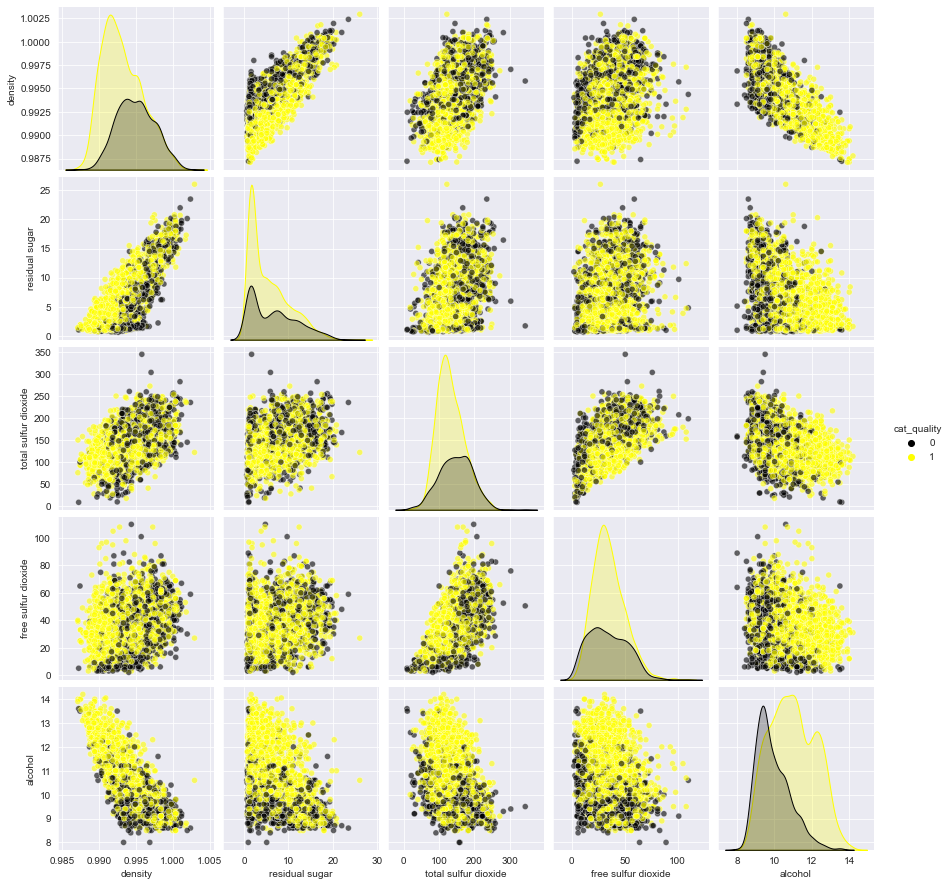

In [42]:
# pairplot for general comparison of only correlated variables
sns.set_style('darkgrid')
## selecting variables
dfw_selected = dfw[['density', 'residual sugar', 'total sulfur dioxide', 'free sulfur dioxide', 'alcohol', 'cat_quality']]

## creating customized pairplot
sns.pairplot(data = dfw_selected, hue = 'cat_quality', palette = ['black', 'yellow'], plot_kws={'alpha': 0.6})
#plt.savefig('pairplot_white_quality.jpg', dpi = 300)
plt.show()

**Comments:** Upon new classification, distribution of density and alcoholic levels seem shifted from each other.

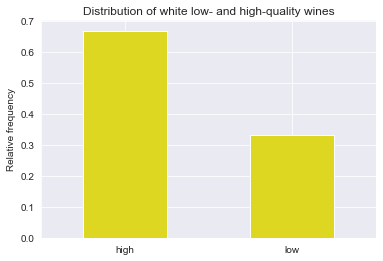

In [43]:
dfw['cat_quality'].value_counts(normalize = True).plot(kind = 'bar', rot = 0, color = '#ded721')
plt.title("Distribution of white low- and high-quality wines")
plt.ylabel("Relative frequency")
plt.show()

In [44]:
# checking differences on alcoholic level of low- and high-quality wines
low_alcohol = dfw['alcohol'][dfw['cat_quality'] == 'low']
high_alcohol = dfw['alcohol'][dfw['cat_quality'] == 'high']

# evaluating the variances
## H0: var1 = var2 or var1 - var2 = 0 || H1: var1 != var2 or var1 - var2 != 0
## confidence interval = 0.90, two-tail test
_, _, p_value_f = f_test_two_samples(low_alcohol, high_alcohol)

# evaluating the means
## H0: mean1 = mean2 or mean1 - mean2 = 0 || H1: mean1 != mean2 or mean1 - mean2 != 0
## confidence interval = 0.95, two-tail test
if p_value_f < 0.05:
    _, p_value_t = sts.ttest_ind(low_alcohol, high_alcohol, equal_var = False)
else:
    _, p_value_t = sts.ttest_ind(low_alcohol, high_alcohol, equal_var = True)

print("Means statistically different?", p_value_t < 0.05)

Means statistically different? True


In [28]:
# checking differences on alcoholic level of low- and high-quality wines
low_alcohol = dfw['density'][dfw['cat_quality'] == 'low']
high_alcohol = dfw['density'][dfw['cat_quality'] == 'high']

# evaluating the variances
## H0: var1 = var2 or var1 - var2 = 0 || H1: var1 != var2 or var1 - var2 != 0
## confidence interval = 0.90, two-tail test
_, _, p_value_f = f_test_two_samples(low_alcohol, high_alcohol)

# evaluating the means
## H0: mean1 = mean2 or mean1 - mean2 = 0 || H1: mean1 != mean2 or mean1 - mean2 != 0
## confidence interval = 0.95, two-tail test
if p_value_f < 0.05:
    _, p_value_t = sts.ttest_ind(low_alcohol, high_alcohol, equal_var = False)
else:
    _, p_value_t = sts.ttest_ind(low_alcohol, high_alcohol, equal_var = True)

print("Means statistically different?", p_value_t < 0.05)

Means statistically different? True


---
## Machine learning models
### Predicting red and white wine quality based on the biochemical properties of each wine type

##### Testing distinct models

In [30]:
# preparing datasets
## cat_quality column -> low = 0 | high = 1
dfr['cat_quality'] = np.where(dfr['cat_quality'] == 'low', 0, 1)
dfw['cat_quality'] = np.where(dfw['cat_quality'] == 'low', 0, 1)

In [46]:
dfr.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,label,cat_quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red,1
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5,red,0


In [47]:
dfw.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,label,cat_quality
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white,1
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white,0
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white,1
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white,1
4897,6.0,0.21,0.38,0.8,0.020,22.0,98.0,0.98941,3.26,0.32,11.8,6,white,1


In [29]:
# Testing models for red wines
## selecting columns
del1, del2 = np.where(dfr.columns == 'quality'), np.where(dfr.columns == 'label') # unnecessary columns
col = np.delete(dfr.columns, [del1, del2])

## defining features and target columns
X = dfr[col[:-1]] # all columns except for cat_quality
y = dfr[col[-1]] # cat_quality columns

# testing models

# models
list_models = [
{'model_name': 'Logistic Regression',
 'estimator' : LogisticRegression(random_state=42)},
{'model_name': 'Tree classification',
 'estimator' : DecisionTreeClassifier(random_state=42)},
{'model_name': 'Random Forest',
 'estimator' : RandomForestClassifier(random_state=42)},
{'model_name': 'AdaBoost',
 'estimator' : AdaBoostClassifier(random_state=42)},
{'model_name': 'XGB_Classifier',
 'estimator' : XGBClassifier(random_state=42, use_label_encoder=False)},
{'model_name': 'Support Vector Machine',
 'estimator' : SVC(random_state=42, probability = True)},
{'model_name': 'KNN',
 'estimator' : KNeighborsClassifier()},
{'model_name': 'Naive_Bayes',
 'estimator' : GaussianNB()}
]

Cross-validation: [0.7394 0.7455 0.7439 0.7561 0.7683]
Mean: 0.7506
Standard deviation: 0.0104
Model      : Logistic Regression
Accuracy   : 0.7564 
Precision  : 0.7587 
Recall     : 0.7564 
F1 - Score : 0.7567 
F1 - Score for class 0: 0.75
F1 - Score for class 1: 0.77
ROC - AUC  : 0.7576 
Cross-validation: [0.697  0.6788 0.75   0.7317 0.6951]
Mean: 0.7105
Standard deviation: 0.0262
Model      : Tree classification
Accuracy   : 0.6572 
Precision  : 0.6604 
Recall     : 0.6572 
F1 - Score : 0.6576 
F1 - Score for class 0: 0.65
F1 - Score for class 1: 0.67
ROC - AUC  : 0.6585 
Cross-validation: [0.7273 0.7455 0.7866 0.7866 0.7683]
Mean: 0.7629
Standard deviation: 0.0233
Model      : Random Forest
Accuracy   : 0.7620 
Precision  : 0.7633 
Recall     : 0.7620 
F1 - Score : 0.7623 
F1 - Score for class 0: 0.75
F1 - Score for class 1: 0.77
ROC - AUC  : 0.7625 
Cross-validation: [0.6848 0.7394 0.7561 0.7561 0.7439]
Mean: 0.7361
Standard deviation: 0.0265
Model      : AdaBoost
Accuracy   : 0.7

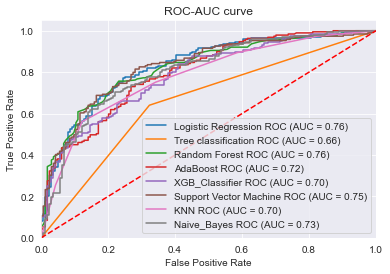

In [49]:
test_models_metrics(X,
                    y,
                    model_list=list_models,
                    col_model_name='model_name',
                    col_model='estimator',
                    cross_validation_split_number = 5,
                    stratify = y,
                    #save_fig = True
                   )

**Comments:** The general testing above showed that among the tested models, logistic regression, random forest and support vector machine yielded the best results and will be used hereafter for red wines.

Cross-validation: [0.7674 0.7505 0.7298 0.7261 0.7594]
Mean: 0.7466
Standard deviation: 0.0162
Model      : Logistic Regression
Accuracy   : 0.7612 
Precision  : 0.7531 
Recall     : 0.7612 
F1 - Score : 0.7526 
F1 - Score for class 0: 0.60
F1 - Score for class 1: 0.83
ROC - AUC  : 0.7030 
Cross-validation: [0.6942 0.7111 0.7017 0.6398 0.7086]
Mean: 0.6911
Standard deviation: 0.0263
Model      : Tree classification
Accuracy   : 0.6920 
Precision  : 0.6954 
Recall     : 0.6920 
F1 - Score : 0.6936 
F1 - Score for class 0: 0.55
F1 - Score for class 1: 0.77
ROC - AUC  : 0.6579 
Cross-validation: [0.7824 0.7824 0.7617 0.7467 0.7876]
Mean: 0.7722
Standard deviation: 0.0155
Model      : Random Forest
Accuracy   : 0.7848 
Precision  : 0.7807 
Recall     : 0.7848 
F1 - Score : 0.7819 
F1 - Score for class 0: 0.66
F1 - Score for class 1: 0.84
ROC - AUC  : 0.7453 
Cross-validation: [0.7561 0.7392 0.7355 0.7223 0.782 ]
Mean: 0.747
Standard deviation: 0.0205
Model      : AdaBoost
Accuracy   : 0.76

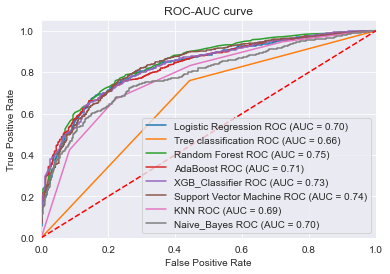

In [50]:
# Testing models for white wines
## selecting columns
del1, del2 = np.where(dfw.columns == 'quality'), np.where(dfw.columns == 'label') # unnecessary columns
col = np.delete(dfw.columns, [del1, del2])

## defining features and target columns
X = dfw[col[:-1]] # all columns except for cat_quality
y = dfw[col[-1]] # cat_quality columns

# testing models
test_models_metrics(X,
                    y,
                    model_list=list_models,
                    col_model_name='model_name',
                    col_model='estimator',
                    cross_validation_split_number = 5,
                    stratify = y,
                    #save_fig = True
                   )

**Comments:** For white wine random forest and support vector machine were also the best models. Interestingly, logistic regression was replaced by XGB_classifier (a gradient boosting model).

---
### Red wines - model optimization

In [51]:
## selecting columns
del1, del2 = np.where(dfr.columns == 'quality'), np.where(dfr.columns == 'label') # unnecessary columns
col = np.delete(dfr.columns, [del1, del2])

## defining features and target columns
X = dfr[col[:-1]] # all columns except for cat_quality
y = dfr[col[-1]] # cat_quality columns

## splitting dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

## scaling dataset
sc = StandardScaler()
X_train[X.columns] = sc.fit_transform(X_train[X.columns])
X_test[X.columns] = sc.transform(X_test[X.columns])

##### Logistic regression

In [52]:
# Logistic regression - random grid
## l1_ratio -> Elastic-net mixing parameter. l1_ratio = 0 equals to penalty = 'l2'. l1_ratio = 1 equals to penalty = 'l1'. Values in between equals to 'Elastic-net'
## For l1_ratio to work, penalty = 'elasticnet'
penalty = ['elasticnet', None]
l1_ratio = [(x / 10) for x in range(0, 11)]

## C -> Inverse of regularization strength; must be a positive float.
C = [0.1, 1.0, 2.0, 10.0]

## solver -> Algorithm to use in the optimization problem
solver = ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']

## max_iter -> Maximum number of iterations taken for the solvers to converge.
max_iter = [25, 50, 100]

# estimator
model = LogisticRegression(random_state = 42)

# cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=7)

# random search
grid_param = {'penalty': penalty,
              'l1_ratio': l1_ratio,
              'C': C,
              'solver': solver,
              'max_iter': max_iter}

# display
pprint(grid_param)

random_search = RandomizedSearchCV(estimator = model,
                                   param_distributions = grid_param,
                                   scoring = 'f1',
                                   cv = cv,
                                   n_iter = 100,
                                   random_state = 101,
                                   verbose = 1)

{'C': [0.1, 1.0, 2.0, 10.0],
 'l1_ratio': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
 'max_iter': [25, 50, 100],
 'penalty': ['elasticnet', None],
 'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}


In [53]:
# fitting the search
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=7, shuffle=True),
                   estimator=LogisticRegression(random_state=42), n_iter=100,
                   param_distributions={'C': [0.1, 1.0, 2.0, 10.0],
                                        'l1_ratio': [0.0, 0.1, 0.2, 0.3, 0.4,
                                                     0.5, 0.6, 0.7, 0.8, 0.9,
                                                     1.0],
                                        'max_iter': [25, 50, 100],
                                        'penalty': ['elasticnet', None],
                                        'solver': ['newton-cg', 'lbfgs',
                                                   'liblinear', 'sag',
                                                   'saga']},
                   random_state=101, scoring='f1', verbose=1)

In [54]:
# summary table with results sorted from the best ranked parameters
table_results_red_lom = pd.DataFrame(random_search.cv_results_)
# mean scoring value and best parameters
f1_score_random = random_search.cv_results_['mean_test_score']
mean_f1_score_random = f1_score_random[~np.isnan(f1_score_random)].mean()
print("Mean_F1_score: ", np.around(mean_f1_score_random, 2))
best_param_random = random_search.best_params_
print("\nBest parameters: ")
pprint(best_param_random)

Mean_F1_score:  0.75

Best parameters: 
{'C': 1.0,
 'l1_ratio': 0.7,
 'max_iter': 25,
 'penalty': 'elasticnet',
 'solver': 'saga'}


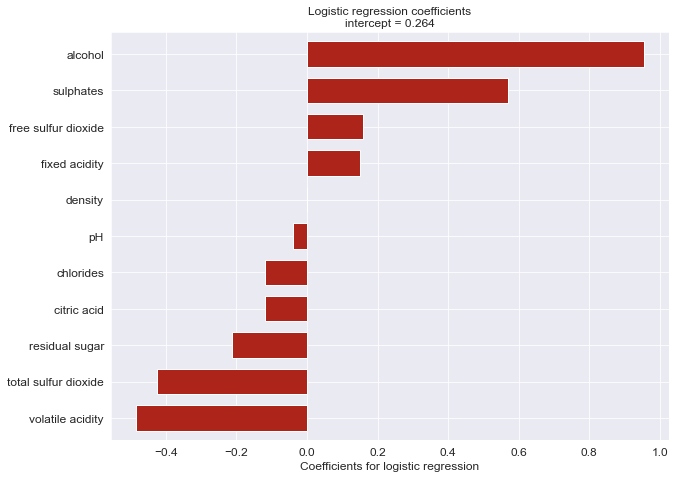

In [55]:
# deploying model with best parameters
model = LogisticRegression(C = 1,
                           l1_ratio = 0.7,
                           max_iter = 25,
                           penalty = 'elasticnet',
                           solver = 'saga',
                           random_state=42)


# fitting the model
model.fit(X_train, y_train)

# finding coefficients and intercept
coeff = model.coef_
intercept = model.intercept_.round(3)

# plotting coefficients
table_coeff = pd.DataFrame(data = coeff.reshape(-1, 1), columns = ['coeff'], index = X.columns).sort_values(by = 'coeff')
table_coeff.plot(kind = 'barh', 
                 figsize = (10, 7.5),
                 legend = False,
                 title = 'Logistic regression coefficients\nintercept = {}'.format(intercept[0]),
                 width = 0.7,
                 color = '#ad241a',
                 fontsize = 12)
plt.xlabel('Coefficients for logistic regression', fontsize = 12)
plt.show()

In [56]:
# explaining the model with SHAP
## initializing java script
shap.initjs()

## find explainers
explainer = shap.LinearExplainer(model, X_train)
shap_object = explainer(X_train)
shap_values = explainer.shap_values(X_train)

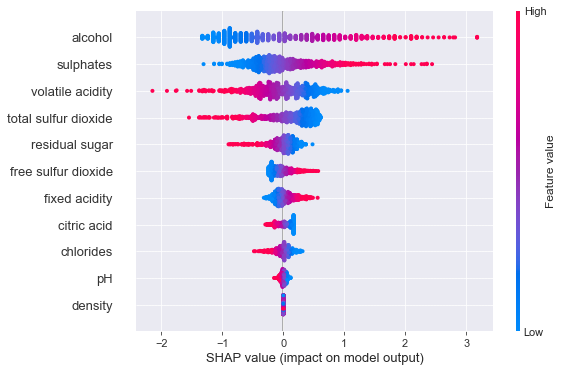

In [57]:
shap.summary_plot(shap_values, X_train)

**Comments:** Alcoholic content, sulphates, volatile acidity and total sulfur dioxide  are the features that most impact on red wine quality according to logistic regression.
- alcohol and sulphates: Values above the mean (0 for scaled data) contribute more to classification as high-quality
- volatile acidity and total sulfur dioxide: Values below the mean increase chance of classification falling into high-quality.
- It's interesting how sulphates didn't seem highly correlated to any other feature but was deemed very important to predict red wine quality based on Logistic model.

In [58]:
# working out the predictions
y_proba = model.predict_proba(X_test)[:, 1]
results_test = pd.DataFrame(zip(y_test, np.around(y_proba, 3)), columns=['target', 'proba'])
df_results = best_classification_split_score(results_test, threshold_increment=0.02,colum_probabilities='proba')
# table
df_results.sort_values(by=['f1_score', 'recall'], ascending=False).head(5)

0.02 0.04 0.06 0.08 0.1 0.12 0.14 0.16 0.18 0.2 0.22 0.24 0.26 0.28 0.3 0.32 0.34 0.36 0.38 0.4 0.42 0.44 0.46 0.48 0.5 0.52 0.54 0.56 0.58 0.6 0.62 0.64 0.66 0.68 0.7 0.72 0.74 0.76 0.78 0.8 0.82 0.84 0.86 0.88 0.9 0.92 0.94 0.96 0.98 1.0 

,threshold,TN,FN,FP,TP,precision,recall,accuracy,f0_score,f1_score
18,0.38,99,21,65,168,0.7210,0.8889,0.7564,0.6972,0.7962
19,0.40,102,23,62,166,0.7281,0.8783,0.7592,0.7059,0.7962
20,0.42,104,27,60,162,0.7297,0.8571,0.7535,0.7051,0.7883
13,0.28,79,11,85,178,0.6768,0.9418,0.7280,0.6220,0.7876
17,0.36,94,21,70,168,0.7059,0.8889,0.7422,0.6738,0.7869


**Comments:** By choosing the threshold at 0.38, f1-score increases 3.2% in accuracy while f1-score decreases 2.5% in accuracy, which seems a good trade off to predict good red wines.

Class report test
               precision    recall  f1-score   support

           0       0.82      0.60      0.70       164
           1       0.72      0.89      0.80       189

    accuracy                           0.76       353
   macro avg       0.77      0.75      0.75       353
weighted avg       0.77      0.76      0.75       353



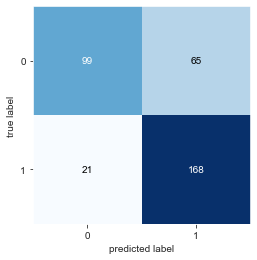

In [59]:
# Cria a resposta com o novo threshold
y_pred = np.where(y_proba >= 0.38, 1, 0)

# metrics
cr_test, cm_test = classification_report(y_test, y_pred), confusion_matrix(y_test, y_pred)
print('Class report test\n', cr_test)
plot_confusion_matrix(cm_test)

plt.show()

---
### Random Forest

In [60]:
# Random Forest - random grid
## n_estimators -> The number of trees in the forest
n_estimators = [x for x in range(250, 1001, 250)]
n_estimators.extend([25, 50, 100])

## criterion -> The function to measure the quality of a split
criterion = ["gini", "entropy"]

## min_samples_split -> The minimum number of samples required to split an internal node
#min_samples_split = [(x / 100) for x in range(2, 11, 2)]
#min_samples_split.append(0.01)
min_samples_split = [x for x in range(2, 11, 2)]

## in_samples_leaf -> The minimum number of samples required to be at a leaf node.
#min_samples_leaf = [(x / 100) for x in range(2, 11, 2)]
#min_samples_leaf.extend([0.005, 0.01])
min_samples_leaf = [x for x in range (1, 13, 2)]

## max_features -> The number of features to consider when looking for the best split
max_features = ["auto", "sqrt", "log2"]

## min_impurity_decrease -> A node will be split if this split induces a decrease of the impurity greater than or equal to this value.
min_impurity_decrease = [(x / 10) for x in range(0, 11, 2)]

# estimator
model = RandomForestClassifier(random_state = 42)

# cross-validation
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=7)

# random search
grid_param = {'n_estimators': n_estimators,
              'criterion': criterion,
              'min_samples_split': min_samples_split,
              'min_samples_leaf': min_samples_leaf,
              'max_features': max_features,
              'min_impurity_decrease': min_impurity_decrease}

# display
pprint(grid_param)

random_search = RandomizedSearchCV(estimator = model,
                                   param_distributions = grid_param,
                                   scoring = 'f1',
                                   cv = cv,
                                   n_iter = 200,
                                   random_state = 101,
                                   verbose = 1,
                                   n_jobs = -1)

{'criterion': ['gini', 'entropy'],
 'max_features': ['auto', 'sqrt', 'log2'],
 'min_impurity_decrease': [0.0, 0.2, 0.4, 0.6, 0.8, 1.0],
 'min_samples_leaf': [1, 3, 5, 7, 9, 11],
 'min_samples_split': [2, 4, 6, 8, 10],
 'n_estimators': [250, 500, 750, 1000, 25, 50, 100]}


In [61]:
# fitting the search
random_search.fit(X_train, y_train)

Fitting 3 folds for each of 200 candidates, totalling 600 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=3, random_state=7, shuffle=True),
                   estimator=RandomForestClassifier(random_state=42),
                   n_iter=200, n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_impurity_decrease': [0.0, 0.2, 0.4,
                                                                  0.6, 0.8,
                                                                  1.0],
                                        'min_samples_leaf': [1, 3, 5, 7, 9, 11],
                                        'min_samples_split': [2, 4, 6, 8, 10],
                                        'n_estimators': [250, 500, 750, 1000,
                                                         25, 50, 100]},
                   random_state=101, scoring='f1', verb

In [62]:
# summary table with results sorted from the best ranked parameters
table_results_red_rf = pd.DataFrame(random_search.cv_results_)
# mean scoring value and best parameters
f1_score_random = random_search.cv_results_['mean_test_score']
mean_f1_score_random = f1_score_random[~np.isnan(f1_score_random)].mean()
print("Mean_F1_score: ", np.around(mean_f1_score_random, 2))
best_param_random = random_search.best_params_
print("\nBest parameters: ")
pprint(best_param_random)

Mean_F1_score:  0.71

Best parameters: 
{'criterion': 'gini',
 'max_features': 'auto',
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 9,
 'min_samples_split': 6,
 'n_estimators': 100}


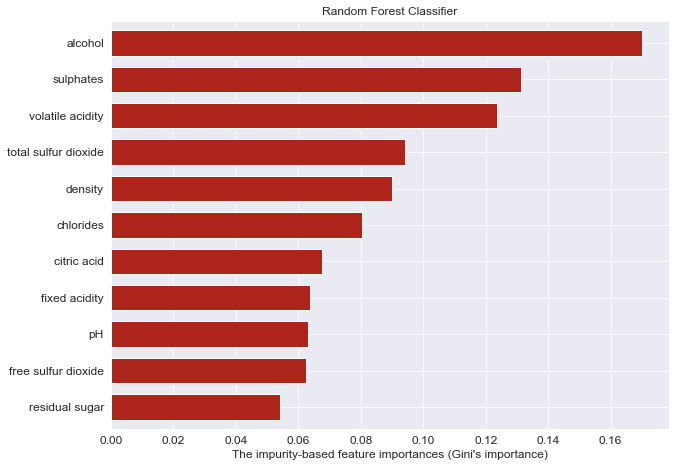

In [63]:
# deploying model with best parameters

#model = RandomForestClassifier(criterion = 'gini',
#                               max_features = 'auto',
#                               min_impurity_decrease = 0.0,
#                               min_samples_leaf = 9,
#                               min_samples_split = 6,
#                               n_estimators = 100)

model = RandomForestClassifier() # Default parameters were maintained as they resulted in better prediction than those predicted by Random Search.

# fitting the model
model.fit(X_train, y_train)

# finding coefficients and intercept
feature_importance = model.feature_importances_

# plotting coefficients
table_coeff = pd.DataFrame(data = feature_importance.reshape(-1, 1), columns = ['feature_importance'], index = X.columns).sort_values(by = 'feature_importance')
table_coeff.plot(kind = 'barh', 
                 figsize = (10, 7.5),
                 legend = False,
                 title = 'Random Forest Classifier',
                 width = 0.7,
                 color = '#ad241a',
                 fontsize = 12)
plt.xlabel("The impurity-based feature importances (Gini's importance)", fontsize = 12)
plt.show()

In [64]:
## find explainers
explainer = shap.TreeExplainer(model)
shap_object = explainer(X_train)
shap_values = explainer.shap_values(X_train)

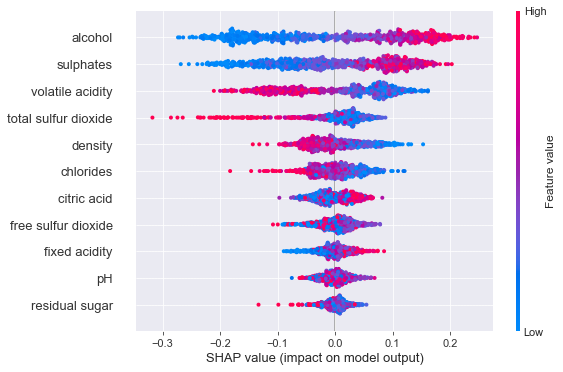

In [65]:
# analysing output == 1 (high-quality red wines)
shap.summary_plot(shap_values[1], X_train)

**Comments:** Random forest classifier also showed alcohol, sulphates, volatile acidity and total sulfur dioxide as the most important features for this model.
- alcohol and sulphates: A few low values and high values bend the model to predic 1
- volatile acidity and density: Low values are related to output == 1

In [66]:
# working out the predictions
y_proba = model.predict_proba(X_test)[:, 1]
results_test = pd.DataFrame(zip(y_test, np.around(y_proba, 3)), columns=['target', 'proba'])
df_results = best_classification_split_score(results_test, threshold_increment=0.02,colum_probabilities='proba')
# table
df_results.sort_values(by=['f1_score', 'recall'], ascending=False).head(5)

0.02 0.04 0.06 0.08 0.1 0.12 0.14 0.16 0.18 0.2 0.22 0.24 0.26 0.28 0.3 0.32 0.34 0.36 0.38 0.4 0.42 0.44 0.46 0.48 0.5 0.52 0.54 0.56 0.58 0.6 0.62 0.64 0.66 0.68 0.7 0.72 0.74 0.76 0.78 0.8 0.82 0.84 0.86 0.88 0.9 0.92 0.94 0.96 0.98 1.0 

,threshold,TN,FN,FP,TP,precision,recall,accuracy,f0_score,f1_score
21,0.44,100,23,64,166,0.7217,0.8783,0.7535,0.6969,0.7924
20,0.42,98,22,66,167,0.7167,0.8836,0.7507,0.6901,0.7915
19,0.40,93,20,71,169,0.7042,0.8942,0.7422,0.6715,0.7879
16,0.34,78,12,86,177,0.6730,0.9365,0.7224,0.6142,0.7832
22,0.46,107,31,57,158,0.7349,0.8360,0.7507,0.7086,0.7822


Class report test
               precision    recall  f1-score   support

           0       0.82      0.60      0.69       164
           1       0.72      0.88      0.79       189

    accuracy                           0.75       353
   macro avg       0.77      0.74      0.74       353
weighted avg       0.76      0.75      0.74       353



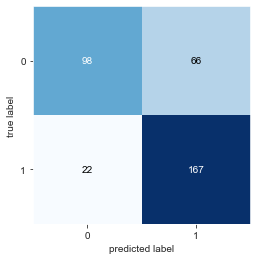

In [67]:
# Cria a resposta com o novo threshold
y_pred = np.where(y_proba >= 0.42, 1, 0)

# metrics
cr_test, cm_test = classification_report(y_test, y_pred), confusion_matrix(y_test, y_pred)
print('Class report test\n', cr_test)
plot_confusion_matrix(cm_test)

plt.show()

In [68]:
# decision path in the forest
model.decision_path(X_train)

(<822x26016 sparse matrix of type '<class 'numpy.int64'>'
 	with 749459 stored elements in Compressed Sparse Row format>,
 array([    0,   245,   514,   757,   998,  1247,  1514,  1793,  2080,
         2373,  2632,  2913,  3156,  3421,  3658,  3915,  4188,  4443,
         4716,  4993,  5212,  5457,  5684,  5953,  6192,  6437,  6674,
         6951,  7204,  7461,  7728,  7981,  8260,  8505,  8728,  9003,
         9276,  9525,  9784, 10073, 10350, 10611, 10880, 11135, 11416,
        11701, 11976, 12249, 12520, 12771, 13026, 13301, 13562, 13841,
        14054, 14303, 14562, 14823, 15078, 15369, 15622, 15901, 16162,
        16435, 16694, 16939, 17192, 17461, 17716, 17979, 18236, 18477,
        18712, 18957, 19212, 19487, 19764, 20027, 20268, 20531, 20786,
        21021, 21280, 21551, 21802, 22065, 22346, 22615, 22880, 23165,
        23394, 23671, 23912, 24171, 24430, 24701, 24944, 25235, 25514,
        25761, 26016], dtype=int32))

---
### Support vector machine classifier

In [69]:
# Support vector machine - random grid
## C -> The strength of the regularization is inversely proportional to C
C = [(x / 10) for x in range(0, 20, 5)]

## kernel -> Specifies the kernel type to be used in the algorithm.
kernel = ['linear', 'poly', 'rbf', 'sigmoid']

## degree -> Degree of the polynomial kernel function ('poly')
degree = [x for x in range(2, 6)]

## gamma -> Kernel coefficient for 'rbf', 'poly' and 'sigmoid'
gamma = ['scale', 'auto']

# estimator
model = SVC(random_state = 42)

# cross-validation
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=7)

# random search
grid_param = {'C': C,
              'kernel': kernel,
              'degree': degree,
              'gamma': gamma}

# display
pprint(grid_param)

random_search = RandomizedSearchCV(estimator = model,
                                   param_distributions = grid_param,
                                   scoring = 'f1',
                                   cv = cv,
                                   n_iter = 200,
                                   random_state = 101,
                                   verbose = 1,
                                   n_jobs = -1)

{'C': [0.0, 0.5, 1.0, 1.5],
 'degree': [2, 3, 4, 5],
 'gamma': ['scale', 'auto'],
 'kernel': ['linear', 'poly', 'rbf', 'sigmoid']}


In [70]:
# fitting the search
random_search.fit(X_train, y_train)

Fitting 3 folds for each of 128 candidates, totalling 384 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=3, random_state=7, shuffle=True),
                   estimator=SVC(random_state=42), n_iter=200, n_jobs=-1,
                   param_distributions={'C': [0.0, 0.5, 1.0, 1.5],
                                        'degree': [2, 3, 4, 5],
                                        'gamma': ['scale', 'auto'],
                                        'kernel': ['linear', 'poly', 'rbf',
                                                   'sigmoid']},
                   random_state=101, scoring='f1', verbose=1)

In [71]:
# summary table with results sorted from the best ranked parameters
table_results_red_svm = pd.DataFrame(random_search.cv_results_)
# mean scoring value and best parameters
f1_score_random = random_search.cv_results_['mean_test_score']
mean_f1_score_random = f1_score_random[~np.isnan(f1_score_random)].mean()
print("Mean_F1_score: ", np.around(mean_f1_score_random, 2))
best_param_random = random_search.best_params_
print("\nBest parameters: ")
pprint(best_param_random)

Mean_F1_score:  0.73

Best parameters: 
{'C': 1.0, 'degree': 5, 'gamma': 'scale', 'kernel': 'poly'}


In [72]:
# deploying model with best parameters

#model = SVC(C = 1.0,
#            degree = 5,
#           gamma = 'scale',
#            kernel = 'poly',
#            probability = True,
#            random_state = 42)

model = SVC(probability = True, random_state = 42) # Default will be kept since it yielded better results than the parameters selected by RandomizedSearchCV. 

# fitting the model
model.fit(X_train, y_train)

SVC(probability=True, random_state=42)

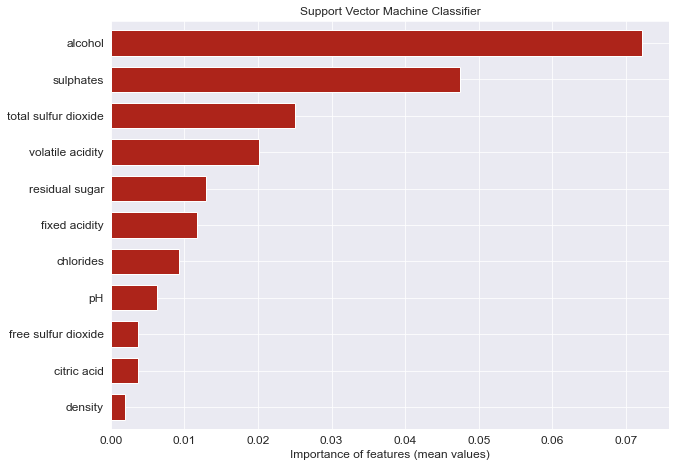

In [73]:
# finding coefficients and intercept
feature_importance = permutation_importance(model, X_train, y_train)

# plotting coefficients
table_coeff = pd.DataFrame(data = feature_importance.importances_mean.reshape(-1, 1), columns = ['feature_importance'], index = X.columns).sort_values(by = 'feature_importance')
table_coeff.plot(kind = 'barh', 
                 figsize = (10, 7.5),
                 legend = False,
                 title = 'Support Vector Machine Classifier',
                 width = 0.7,
                 color = '#ad241a',
                 fontsize = 12)
plt.xlabel("Importance of features (mean values)", fontsize = 12)
plt.show()

In [74]:
# Shap
explainer = shap.KernelExplainer(model.predict_proba, shap.sample(X_train, nsamples=100, random_state=42), link="logit")
#shap_object = explainer(X_train)
shap_values = explainer.shap_values(X_train, nsamples = 100)

  0%|          | 0/822 [00:00<?, ?it/s]

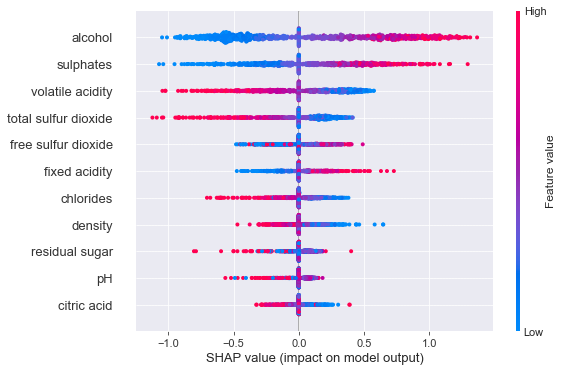

In [75]:
# explaining quality == 1
shap.summary_plot(shap_values[1], X_train)

**Comments:** Once again alcohol and sulphates appears as importante features for predicting red wine quality.
- alcohol and sulphates: High values contribute to good quality
- volatile acidity and free sulfur dioxide: Low values contribute to good quality

In [76]:
# working out the predictions
y_proba = model.predict_proba(X_test)[:, 1]
results_test = pd.DataFrame(zip(y_test, np.around(y_proba, 3)), columns=['target', 'proba'])
df_results = best_classification_split_score(results_test, threshold_increment=0.02,colum_probabilities='proba')
# table
df_results.sort_values(by=['f1_score', 'recall'], ascending=False).head(5)

0.02 0.04 0.06 0.08 0.1 0.12 0.14 0.16 0.18 0.2 0.22 0.24 0.26 0.28 0.3 0.32 0.34 0.36 0.38 0.4 0.42 0.44 0.46 0.48 0.5 0.52 0.54 0.56 0.58 0.6 0.62 0.64 0.66 0.68 0.7 0.72 0.74 0.76 0.78 0.8 0.82 0.84 0.86 0.88 0.9 0.92 0.94 0.96 0.98 1.0 

,threshold,TN,FN,FP,TP,precision,recall,accuracy,f0_score,f1_score
20,0.42,114,22,50,167,0.7696,0.8836,0.7960,0.7600,0.8227
21,0.44,118,25,46,164,0.7810,0.8677,0.7989,0.7687,0.8221
19,0.40,109,20,55,169,0.7545,0.8942,0.7875,0.7440,0.8184
22,0.46,119,27,45,162,0.7826,0.8571,0.7960,0.7677,0.8182
23,0.48,121,29,43,160,0.7882,0.8466,0.7960,0.7707,0.8163


Class report test
               precision    recall  f1-score   support

           0       0.84      0.70      0.76       164
           1       0.77      0.88      0.82       189

    accuracy                           0.80       353
   macro avg       0.80      0.79      0.79       353
weighted avg       0.80      0.80      0.79       353



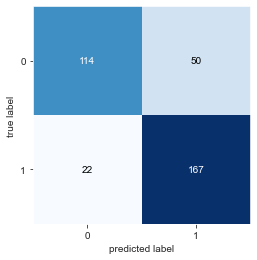

In [77]:
# Cria a resposta com o novo threshold
y_pred = np.where(y_proba >= 0.42, 1, 0)

# metrics
cr_test, cm_test = classification_report(y_test, y_pred), confusion_matrix(y_test, y_pred)
print('Class report test\n', cr_test)
plot_confusion_matrix(cm_test)

plt.show()

---
### White wines - model optimization

In [78]:
## selecting columns
del1, del2 = np.where(dfw.columns == 'quality'), np.where(dfw.columns == 'label') # unnecessary columns
col = np.delete(dfw.columns, [del1, del2])

## defining features and target columns
X = dfw[col[:-1]] # all columns except for cat_quality
y = dfw[col[-1]] # cat_quality columns

## splitting dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify = y)

## scaling dataset
sc = StandardScaler()
X_train[X.columns] = sc.fit_transform(X_train[X.columns])
X_test[X.columns] = sc.transform(X_test[X.columns])

---
##### Random Forest Classifier

In [79]:
# Random Forest - random grid
## n_estimators -> The number of trees in the forest
n_estimators = [x for x in range(250, 1001, 250)]
n_estimators.extend([25, 50, 100])

## criterion -> The function to measure the quality of a split
criterion = ["gini", "entropy"]

## min_samples_split -> The minimum number of samples required to split an internal node
#min_samples_split = [(x / 100) for x in range(2, 11, 2)]
#min_samples_split.append(0.01)
min_samples_split = [x for x in range(2, 11, 2)]

## in_samples_leaf -> The minimum number of samples required to be at a leaf node.
#min_samples_leaf = [(x / 100) for x in range(2, 11, 2)]
#min_samples_leaf.extend([0.005, 0.01])
min_samples_leaf = [x for x in range (1, 13, 2)]

## max_features -> The number of features to consider when looking for the best split
max_features = ["auto", "sqrt", "log2"]

## min_impurity_decrease -> A node will be split if this split induces a decrease of the impurity greater than or equal to this value.
min_impurity_decrease = [(x / 10) for x in range(0, 11, 2)]

# estimator
model = RandomForestClassifier(random_state = 42)

# cross-validation
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=7)

# random search
grid_param = {'n_estimators': n_estimators,
              'criterion': criterion,
              'min_samples_split': min_samples_split,
              'min_samples_leaf': min_samples_leaf,
              'max_features': max_features,
              'min_impurity_decrease': min_impurity_decrease}

# display
pprint(grid_param)

random_search = RandomizedSearchCV(estimator = model,
                                   param_distributions = grid_param,
                                   scoring = 'f1',
                                   cv = cv,
                                   n_iter = 200,
                                   random_state = 101,
                                   verbose = 1,
                                   n_jobs = -1)

{'criterion': ['gini', 'entropy'],
 'max_features': ['auto', 'sqrt', 'log2'],
 'min_impurity_decrease': [0.0, 0.2, 0.4, 0.6, 0.8, 1.0],
 'min_samples_leaf': [1, 3, 5, 7, 9, 11],
 'min_samples_split': [2, 4, 6, 8, 10],
 'n_estimators': [250, 500, 750, 1000, 25, 50, 100]}


In [80]:
# fitting the model
random_search.fit(X_train, y_train)

Fitting 3 folds for each of 200 candidates, totalling 600 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=3, random_state=7, shuffle=True),
                   estimator=RandomForestClassifier(random_state=42),
                   n_iter=200, n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_impurity_decrease': [0.0, 0.2, 0.4,
                                                                  0.6, 0.8,
                                                                  1.0],
                                        'min_samples_leaf': [1, 3, 5, 7, 9, 11],
                                        'min_samples_split': [2, 4, 6, 8, 10],
                                        'n_estimators': [250, 500, 750, 1000,
                                                         25, 50, 100]},
                   random_state=101, scoring='f1', verb

In [81]:
# summary table with results sorted from the best ranked parameters
table_results_white_rf = pd.DataFrame(random_search.cv_results_)
# mean scoring value and best parameters
f1_score_random = random_search.cv_results_['mean_test_score']
mean_f1_score_random = f1_score_random[~np.isnan(f1_score_random)].mean()
print("Mean_F1_score: ", np.around(mean_f1_score_random, 2))
best_param_random = random_search.best_params_
print("\nBest parameters: ")
pprint(best_param_random)

Mean_F1_score:  0.81

Best parameters: 
{'criterion': 'entropy',
 'max_features': 'log2',
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 5,
 'min_samples_split': 2,
 'n_estimators': 500}


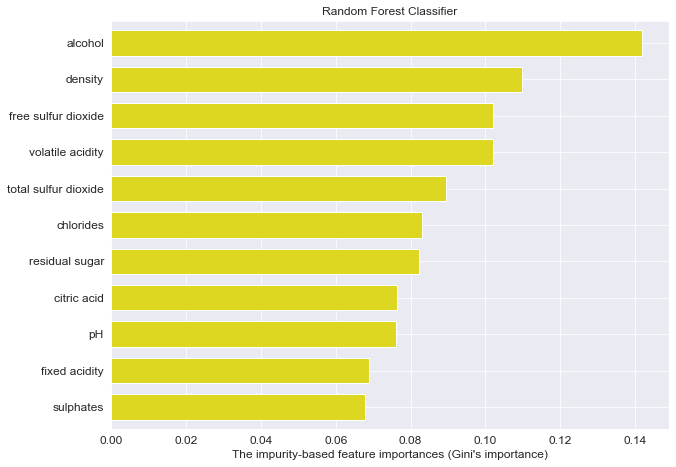

In [82]:
# deploying model with best parameters

#model = RandomForestClassifier(criterion = 'entropy',
#                               max_features = 'log2',
#                               min_impurity_decrease = 0.0,
#                               min_samples_leaf = 5,
#                               min_samples_split = 2,
#                               n_estimators = 500,
#                               random_state = 42)

model = RandomForestClassifier(random_state = 42) # Default parameters performed slightly better than RandomizedSearchCV-selected parameters.

# fitting the model
model.fit(X_train, y_train)

# finding coefficients and intercept
feature_importance = model.feature_importances_

# plotting coefficients
table_coeff = pd.DataFrame(data = feature_importance.reshape(-1, 1), columns = ['feature_importance'], index = X.columns).sort_values(by = 'feature_importance')
table_coeff.plot(kind = 'barh', 
                 figsize = (10, 7.5),
                 legend = False,
                 title = 'Random Forest Classifier',
                 width = 0.7,
                 color = '#ded721',
                 fontsize = 12)
plt.xlabel("The impurity-based feature importances (Gini's importance)", fontsize = 12)
plt.show()

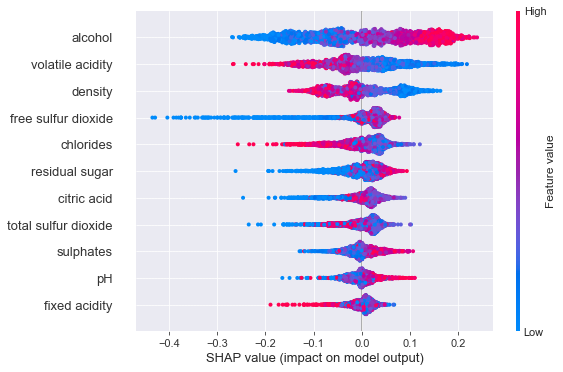

In [83]:
## find explainers
explainer = shap.TreeExplainer(model)
shap_object = explainer(X_train)
shap_values = explainer.shap_values(X_train)
# analysing output == 1 (high-quality white wines)
shap.summary_plot(shap_values[1], X_train)

**Comments:** Random Forest model selected alcohol, volatile acidity, densitty and free sulfur dioxide as the most important features to predict quality of white wine.
- Higher alcohol values and low volatile acidity and density values are realted to wines of better quality

In [84]:
# working out the predictions
y_proba = model.predict_proba(X_test)[:, 1]
results_test = pd.DataFrame(zip(y_test, np.around(y_proba, 3)), columns=['target', 'proba'])
df_results = best_classification_split_score(results_test, threshold_increment=0.02,colum_probabilities='proba')
# table
df_results.sort_values(by=['f1_score', 'recall'], ascending=False).head(5)

0.02 0.04 0.06 0.08 0.1 0.12 0.14 0.16 0.18 0.2 0.22 0.24 0.26 0.28 0.3 0.32 0.34 0.36 0.38 0.4 0.42 0.44 0.46 0.48 0.5 0.52 0.54 0.56 0.58 0.6 0.62 0.64 0.66 0.68 0.7 0.72 0.74 0.76 0.78 0.8 0.82 0.84 0.86 0.88 0.9 0.92 0.94 0.96 0.98 1.0 

,threshold,TN,FN,FP,TP,precision,recall,accuracy,f0_score,f1_score
22,0.46,214,78,165,686,0.8061,0.8979,0.7874,0.6379,0.8495
21,0.44,200,71,179,693,0.7947,0.9071,0.7813,0.6154,0.8472
20,0.42,188,63,191,701,0.7859,0.9175,0.7778,0.5968,0.8466
23,0.48,220,88,159,676,0.8096,0.8848,0.7839,0.6405,0.8455
19,0.40,170,52,209,712,0.7731,0.9319,0.7717,0.5657,0.8451


Class report test
               precision    recall  f1-score   support

           0       0.73      0.56      0.64       379
           1       0.81      0.90      0.85       764

    accuracy                           0.79      1143
   macro avg       0.77      0.73      0.74      1143
weighted avg       0.78      0.79      0.78      1143



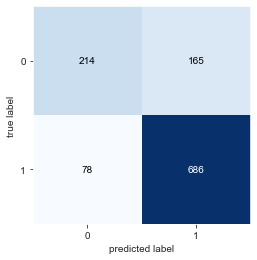

In [85]:
# Cria a resposta com o novo threshold
y_pred = np.where(y_proba >= 0.46, 1, 0)

# metrics
cr_test, cm_test = classification_report(y_test, y_pred), confusion_matrix(y_test, y_pred)
print('Class report test\n', cr_test)
plot_confusion_matrix(cm_test)

plt.show()

---
##### Support Vector Machine

In [86]:
# Support vector machine - random grid
## C -> The strength of the regularization is inversely proportional to C
C = [(x / 10) for x in range(0, 20, 5)]

## kernel -> Specifies the kernel type to be used in the algorithm.
kernel = ['linear', 'poly', 'rbf', 'sigmoid']

## degree -> Degree of the polynomial kernel function ('poly')
degree = [x for x in range(2, 6)]

## gamma -> Kernel coefficient for 'rbf', 'poly' and 'sigmoid'
gamma = ['scale', 'auto']

# estimator
model = SVC(random_state = 42)

# cross-validation
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=7)

# random search
grid_param = {'C': C,
              'kernel': kernel,
              'degree': degree,
              'gamma': gamma}

# display
pprint(grid_param)

random_search = RandomizedSearchCV(estimator = model,
                                   param_distributions = grid_param,
                                   scoring = 'f1',
                                   cv = cv,
                                   n_iter = 200,
                                   random_state = 101,
                                   verbose = 1,
                                   n_jobs = -1)

{'C': [0.0, 0.5, 1.0, 1.5],
 'degree': [2, 3, 4, 5],
 'gamma': ['scale', 'auto'],
 'kernel': ['linear', 'poly', 'rbf', 'sigmoid']}


In [87]:
# fitting the RandomizedSearchCV
random_search.fit(X_train, y_train)

Fitting 3 folds for each of 128 candidates, totalling 384 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=3, random_state=7, shuffle=True),
                   estimator=SVC(random_state=42), n_iter=200, n_jobs=-1,
                   param_distributions={'C': [0.0, 0.5, 1.0, 1.5],
                                        'degree': [2, 3, 4, 5],
                                        'gamma': ['scale', 'auto'],
                                        'kernel': ['linear', 'poly', 'rbf',
                                                   'sigmoid']},
                   random_state=101, scoring='f1', verbose=1)

In [88]:
# summary table with results sorted from the best ranked parameters
table_results_white_svm = pd.DataFrame(random_search.cv_results_) # in case this table is needed to choose alternative combination
# mean scoring value and best parameters
f1_score_random = random_search.cv_results_['mean_test_score']
mean_f1_score_random = f1_score_random[~np.isnan(f1_score_random)].mean()
print("Mean_F1_score: ", np.around(mean_f1_score_random, 2))
best_param_random = random_search.best_params_
print("\nBest parameters: ")
pprint(best_param_random)

Mean_F1_score:  0.81

Best parameters: 
{'C': 1.0, 'degree': 2, 'gamma': 'scale', 'kernel': 'rbf'}


In [89]:
# deploying model with best parameters

model = SVC(C = 1.0,
            degree = 2,
            gamma = 'scale',
            kernel = 'rbf',
            probability = True,
            random_state = 42)

# fitting the model
model.fit(X_train, y_train)

SVC(degree=2, probability=True, random_state=42)

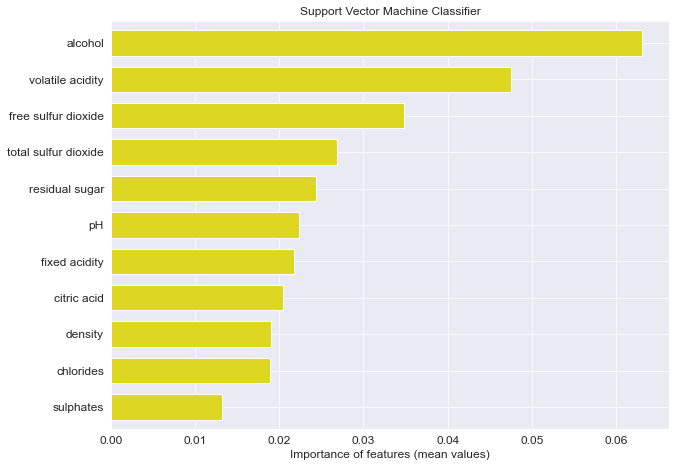

In [90]:
# finding coefficients and intercept
feature_importance = permutation_importance(model, X_train, y_train)

# plotting coefficients
table_coeff = pd.DataFrame(data = feature_importance.importances_mean.reshape(-1, 1), columns = ['feature_importance'], index = X.columns).sort_values(by = 'feature_importance')
table_coeff.plot(kind = 'barh', 
                 figsize = (10, 7.5),
                 legend = False,
                 title = 'Support Vector Machine Classifier',
                 width = 0.7,
                 color = '#ded721',
                 fontsize = 12)
plt.xlabel("Importance of features (mean values)", fontsize = 12)
plt.show()

In [91]:
# creating sample to run shap
## indexes for output 0
index_zero = y_train[y_train == 0].index
size_zero = int(500 * 0.33)
index_zero_choice = np.random.choice(index_zero, size = size_zero, replace = False)

## indexes for output 1
index_one = y_train[y_train == 1].index
size_one = 500 - size_zero
index_one_choice = np.random.choice(index_one, size = size_one, replace = False)

## generating a new dataframe for shap analysis
indexes = np.append(index_zero_choice, index_one_choice)
X_train_reduced = X_train.loc[indexes, :]
X_train_reduced.shape

(500, 11)

  0%|          | 0/500 [00:00<?, ?it/s]

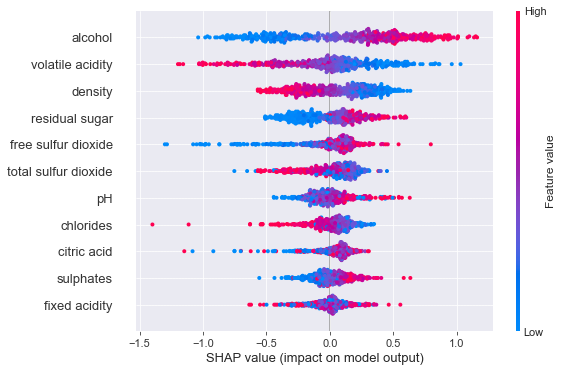

In [92]:
# Shap
# model
explainer = shap.KernelExplainer(model.predict_proba, shap.sample(X_train_reduced, nsamples=100, random_state=42), link="logit") # shap.kmeans(data, K)
#shap_object = explainer(X_train)
shap_values = explainer.shap_values(X_train_reduced)
# explaining quality == 1
shap.summary_plot(shap_values[1], X_train_reduced)

**Comments:** As expected, higher alcohol values and low volatile acidity are related to high quality wines.

In [93]:
# working out the predictions
y_proba = model.predict_proba(X_test)[:, 1]
results_test = pd.DataFrame(zip(y_test, np.around(y_proba, 3)), columns=['target', 'proba'])
df_results = best_classification_split_score(results_test, threshold_increment=0.02, colum_probabilities='proba')
# table
df_results.sort_values(by=['f1_score', 'recall'], ascending=False).head(5)

0.02 0.04 0.06 0.08 0.1 0.12 0.14 0.16 0.18 0.2 0.22 0.24 0.26 0.28 0.3 0.32 0.34 0.36 0.38 0.4 0.42 0.44 0.46 0.48 0.5 0.52 0.54 0.56 0.58 0.6 0.62 0.64 0.66 0.68 0.7 0.72 0.74 0.76 0.78 0.8 0.82 0.84 0.86 0.88 0.9 0.92 0.94 0.96 0.98 1.0 

,threshold,TN,FN,FP,TP,precision,recall,accuracy,f0_score,f1_score
23,0.48,213,81,166,683,0.8045,0.8940,0.7839,0.6330,0.8469
24,0.50,217,86,162,678,0.8071,0.8874,0.7830,0.6364,0.8454
22,0.46,203,77,176,687,0.7961,0.8992,0.7787,0.6161,0.8445
25,0.52,225,94,154,670,0.8131,0.8770,0.7830,0.6447,0.8438
26,0.54,233,100,146,664,0.8198,0.8691,0.7848,0.6545,0.8437


Class report test
               precision    recall  f1-score   support

           0       0.72      0.56      0.63       379
           1       0.80      0.89      0.85       764

    accuracy                           0.78      1143
   macro avg       0.76      0.73      0.74      1143
weighted avg       0.78      0.78      0.78      1143



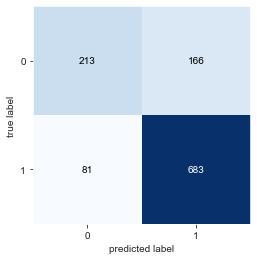

In [94]:
# Cria a resposta com o novo threshold
y_pred = np.where(y_proba >= 0.48, 1, 0)

# metrics
cr_test, cm_test = classification_report(y_test, y_pred), confusion_matrix(y_test, y_pred)
print('Class report test\n', cr_test)
plot_confusion_matrix(cm_test)

plt.show()

---
##### Gradient Boosting classifier

In [95]:
# Gradient boosting - random grid
## n_estimators -> Number of boosting rounds.
n_estimators = [x for x in range(50, 351, 50)]

## max_depth -> Maximum tree depth for base learners
max_depth = [x for x in range(1, 9, 2)]

## booster
booster = ['gbtree', 'gblinear', 'dart']

# estimator
model = XGBClassifier(random_state = 42, use_label_encoder=False)

# cross-validation
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=7)

# random search
grid_param = {'n_estimators': n_estimators,
              'max_depth': max_depth,
              'booster': booster}

# display
pprint(grid_param)

random_search = RandomizedSearchCV(estimator = model,
                                   param_distributions = grid_param,
                                   scoring = 'neg_log_loss',
                                   cv = cv,
                                   n_iter = 200,
                                   random_state = 101,
                                   verbose = 1,
                                   n_jobs = -1)

{'booster': ['gbtree', 'gblinear', 'dart'],
 'max_depth': [1, 3, 5, 7],
 'n_estimators': [50, 100, 150, 200, 250, 300, 350]}


In [96]:
%%time
# fitting
random_search.fit(X_train, y_train)

Fitting 3 folds for each of 84 candidates, totalling 252 fits
[21:50:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Wall time: 5min


RandomizedSearchCV(cv=StratifiedKFold(n_splits=3, random_state=7, shuffle=True),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           enable_categorical=False, gamma=None,
                                           gpu_id=None, importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,...
                                           predictor=None, random_state=42,
                                           reg_alpha=None, reg_lambda=None,
                                           scale_pos_weight=None,
                                           subsamp

In [97]:
# summary table with results sorted from the best ranked parameters
table_results_white_gbst = pd.DataFrame(random_search.cv_results_)
# mean scoring value and best parameters
f1_score_random = random_search.cv_results_['mean_test_score']
mean_f1_score_random = f1_score_random[~np.isnan(f1_score_random)].mean()
print("Negative_log_loss: ", np.around(mean_f1_score_random, 2))
best_param_random = random_search.best_params_
print("\nBest parameters: ")
pprint(best_param_random)

Negative_log_loss:  -0.58

Best parameters: 
{'booster': 'gbtree', 'max_depth': 1, 'n_estimators': 100}


In [98]:
# deploying model with best parameters

#model = XGBClassifier(booster = 'gbtree',
#                      max_depth = 1,
#                      n_estimators = 100,
#                      use_label_encoder=False,
#                      random_state = 42)

model = XGBClassifier(use_label_encoder=False, random_state = 42) # Default parameters worked better than those predicted.

# fitting the model
model.fit(X_train, y_train)

[21:50:14] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=4,
              num_parallel_tree=1, predictor='auto', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', use_label_encoder=False,
              validate_parameters=1, verbosity=None)

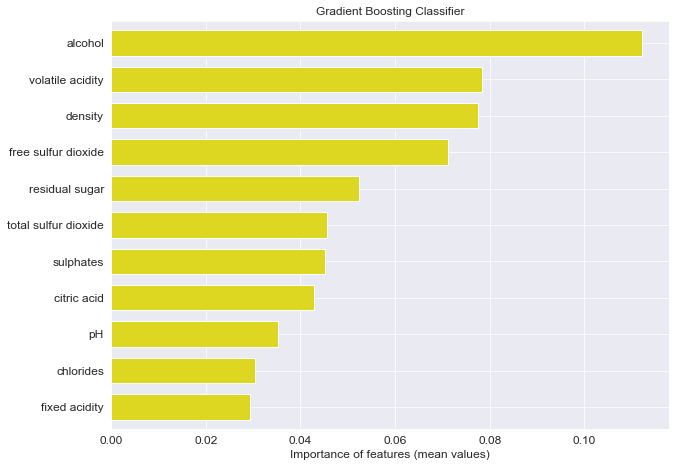

In [99]:
# finding coefficients and intercept
feature_importance = permutation_importance(model, X_train, y_train)

# plotting coefficients
table_coeff = pd.DataFrame(data = feature_importance.importances_mean.reshape(-1, 1), columns = ['feature_importance'], index = X.columns).sort_values(by = 'feature_importance')
table_coeff.plot(kind = 'barh', 
                 figsize = (10, 7.5),
                 legend = False,
                 title = 'Gradient Boosting Classifier',
                 width = 0.7,
                 color = '#ded721',
                 fontsize = 12)
plt.xlabel("Importance of features (mean values)", fontsize = 12)
plt.show()

In [100]:
# model
explainer = shap.Explainer(model, X_train)
#shap_object = explainer(X_train)
shap_values = explainer.shap_values(X_train)

 94%|=================== | 2517/2664 [00:14<00:00]       

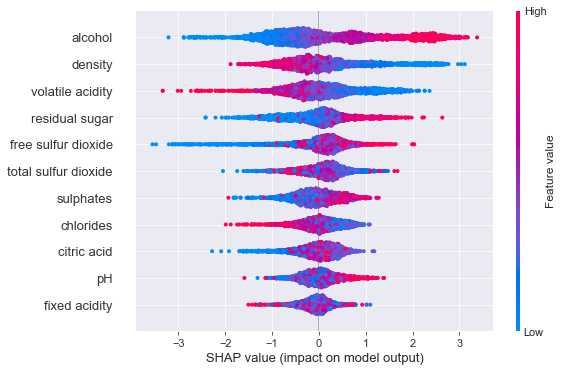

In [101]:
# explaining quality == 1
shap.summary_plot(shap_values, X_train)

**Comments:** High alcohol and residual sugar values are related to high-quality wines. Conversely, low density and volatile acidity relates to high-wine quality. 

In [102]:
# working out the predictions
y_proba = model.predict_proba(X_test)[:, 1]
results_test = pd.DataFrame(zip(y_test, np.around(y_proba, 3)), columns=['target', 'proba'])
df_results = best_classification_split_score(results_test, threshold_increment=0.02,colum_probabilities='proba')
# table
df_results.sort_values(by=['f1_score', 'recall'], ascending=False).head(5)

0.02 0.04 0.06 0.08 0.1 0.12 0.14 0.16 0.18 0.2 0.22 0.24 0.26 0.28 0.3 0.32 0.34 0.36 0.38 0.4 0.42 0.44 0.46 0.48 0.5 0.52 0.54 0.56 0.58 0.6 0.62 0.64 0.66 0.68 0.7 0.72 0.74 0.76 0.78 0.8 0.82 0.84 0.86 0.88 0.9 0.92 0.94 0.96 0.98 1.0 

,threshold,TN,FN,FP,TP,precision,recall,accuracy,f0_score,f1_score
21,0.44,220,99,159,665,0.8070,0.8704,0.7743,0.6304,0.8375
26,0.54,238,115,141,649,0.8215,0.8495,0.7760,0.6503,0.8353
25,0.52,235,113,144,651,0.8189,0.8521,0.7752,0.6465,0.8352
24,0.50,232,111,147,653,0.8162,0.8547,0.7743,0.6427,0.8350
20,0.42,208,94,171,670,0.7967,0.8770,0.7682,0.6109,0.8349


Class report test
               precision    recall  f1-score   support

           0       0.69      0.58      0.63       379
           1       0.81      0.87      0.84       764

    accuracy                           0.77      1143
   macro avg       0.75      0.73      0.73      1143
weighted avg       0.77      0.77      0.77      1143



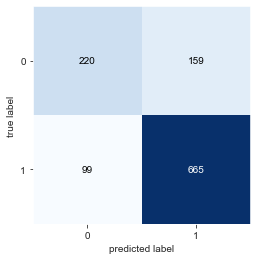

In [103]:
# Cria a resposta com o novo threshold
y_pred = np.where(y_proba >= 0.44, 1, 0)

# metrics
cr_test, cm_test = classification_report(y_test, y_pred), confusion_matrix(y_test, y_pred)
print('Class report test\n', cr_test)
plot_confusion_matrix(cm_test)

plt.show()

# Extra analysis

### Predicting low and high quality wines without separation by wine type

In [32]:
# creating a new dataset and reindexing it
df_join = pd.concat([dfr, dfw])
df_join.reset_index(drop = True, inplace = True)

In [33]:
df_join

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,label,cat_quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,red,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,red,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,red,1
4,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5,red,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4977,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white,1
4978,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white,0
4979,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white,1
4980,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white,1


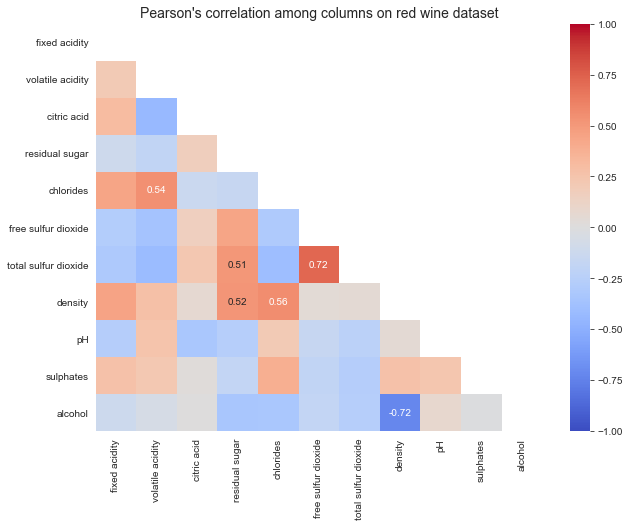

In [36]:
# selecting the columns that will be used
deletion1, deletion2, deletion3 = np.where(df_join.columns == 'quality'), np.where(df_join.columns == 'label'), np.where(df_join.columns == 'cat_quality')
col = np.delete(df_join.columns, [deletion1, deletion2, deletion3])

# finding correlations
corr = df_join[col].corr(method='pearson').round(2) # round values to two floating points. Needed should fmt = ''

# plotting correlation
sns.set_style('white')
plt.figure(figsize = (10, 7.5))
sns.heatmap(data = corr,
            cmap = 'coolwarm',
            annot = corr.where(corr >= 0.5, corr.where(corr <= -0.5, '')), # conditional to show only correlations <= -0.5 or correlations >= 0.5
            vmin = -1,
            vmax = 1,
            mask = np.triu(corr.corr("pearson")),
            fmt = '') # necessary in case conditional is passed in and there is a string
plt.title("Pearson's correlation among columns on red wine dataset", fontsize = 14)
plt.show()

**Comments:** Some correlated features were found:
- chlorides and volatile acidity (+)
- total sulfur dioxide and residual sugar (+), total sulfur dioxide and free sulfur dioxide (+)
- density and residual sugar (+), density and chlorides (+)
- alcohol and density (-)

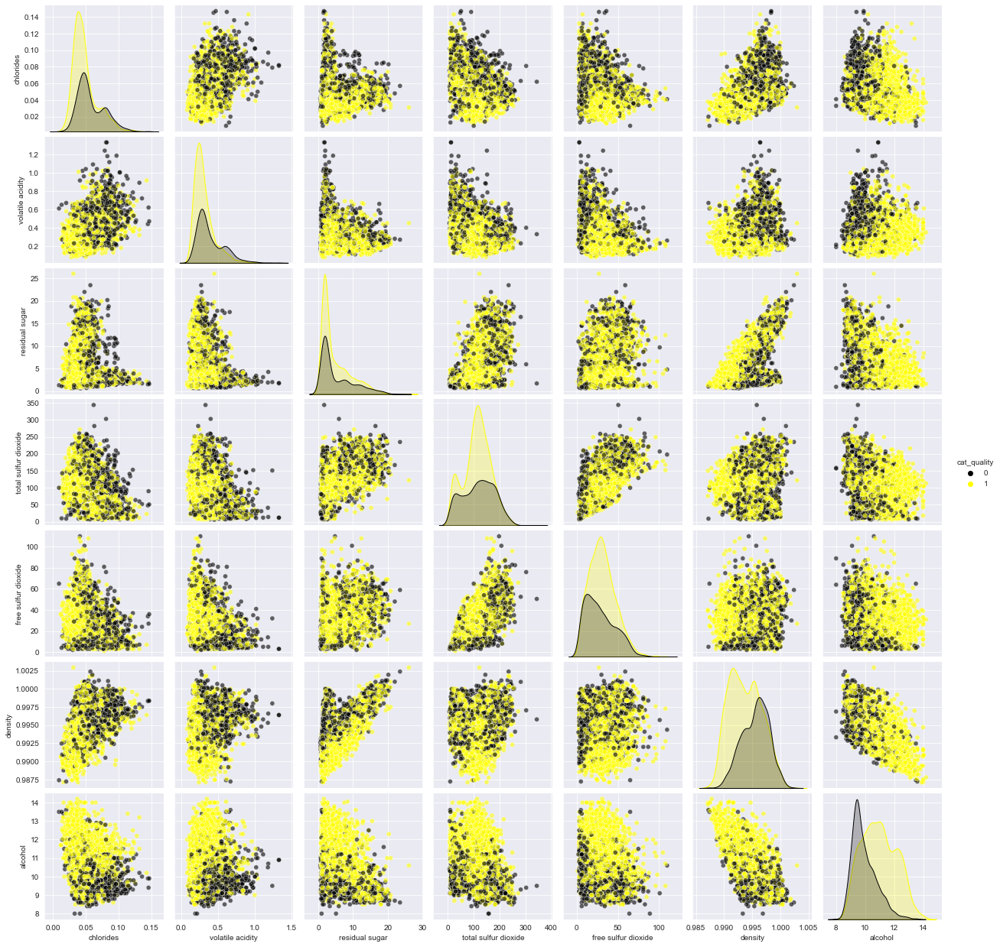

In [43]:
# pairplot for general comparison of only correlated variables
sns.set_style('darkgrid')
## selecting variables
df_join_selected = df_join[['chlorides', 'volatile acidity', 'residual sugar', 'total sulfur dioxide', 'free sulfur dioxide', 'density', 'alcohol', 'cat_quality']]

## creating customized pairplot
sns.pairplot(data = df_join_selected, hue = 'cat_quality', palette = ['black', 'yellow'], plot_kws={'alpha': 0.6})
#plt.savefig('pairplot_wine_quality_correlated.jpg', dpi = 300)
plt.show()

**Comments:** It'd seem that distribtutions of alcohol and density shifts between low and high quality wines.

In [50]:
# checking differences on alcoholic level of low- and high-quality wines
low_alcohol = df_join['density'][df_join['cat_quality'] == 0]
high_alcohol = df_join['density'][df_join['cat_quality'] == 1]

# evaluating the variances
## H0: var1 = var2 or var1 - var2 = 0 || H1: var1 != var2 or var1 - var2 != 0
## confidence interval = 0.90, two-tail test
_, _, p_value_f = f_test_two_samples(low_alcohol, high_alcohol)

# evaluating the means
## H0: mean1 = mean2 or mean1 - mean2 = 0 || H1: mean1 != mean2 or mean1 - mean2 != 0
## confidence interval = 0.95, two-tail test
if p_value_f < 0.05:
    _, p_value_t = sts.ttest_ind(low_alcohol, high_alcohol, equal_var = False)
else:
    _, p_value_t = sts.ttest_ind(low_alcohol, high_alcohol, equal_var = True)

print("Means statistically different?", p_value_t < 0.05)

Means statistically different? True


In [51]:
# checking differences on alcoholic level of low- and high-quality wines
low_alcohol = df_join['alcohol'][df_join['cat_quality'] == 0]
high_alcohol = df_join['alcohol'][df_join['cat_quality'] == 1]

# evaluating the variances
## H0: var1 = var2 or var1 - var2 = 0 || H1: var1 != var2 or var1 - var2 != 0
## confidence interval = 0.90, two-tail test
_, _, p_value_f = f_test_two_samples(low_alcohol, high_alcohol)

# evaluating the means
## H0: mean1 = mean2 or mean1 - mean2 = 0 || H1: mean1 != mean2 or mean1 - mean2 != 0
## confidence interval = 0.95, two-tail test
if p_value_f < 0.05:
    _, p_value_t = sts.ttest_ind(low_alcohol, high_alcohol, equal_var = False)
else:
    _, p_value_t = sts.ttest_ind(low_alcohol, high_alcohol, equal_var = True)

print("Means statistically different?", p_value_t < 0.05)

Means statistically different? True


**Comments:** Statistics confirm the hypothesis of different means.

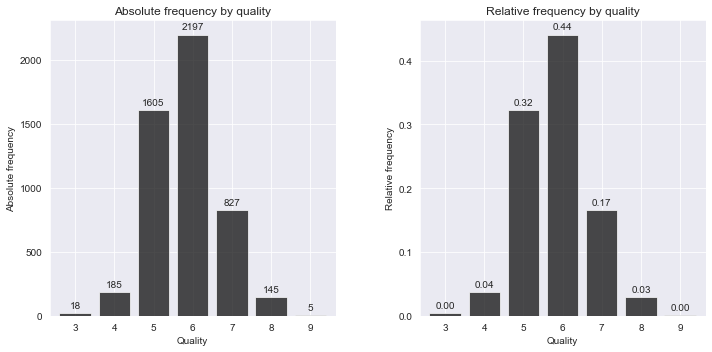

In [44]:
# analyzing the quality column of wines
# figure size and style
sns.set_style('darkgrid')
plt.figure(figsize = (10, 5))

## absolute frequency
abs_freq = df_join['quality'].value_counts().sort_index()
xa = abs_freq.index
ya = abs_freq.values
ax1 = plt.subplot(121)
abs_freq.plot(kind = 'bar', color = 'black', alpha = 0.7, width = 0.8, rot = 0, ax = ax1)
ax1.set_title('Absolute frequency by quality')
ax1.set_xlabel("Quality")
ax1.set_ylabel("Absolute frequency")
ax1.bar_label(ax1.containers[0], padding = 3) # mostrando os valores no topo das barras de vinho tinto

# relative frequency
rel_freq = df_join['quality'].value_counts(normalize = True).sort_index()
x = rel_freq.index
y = rel_freq.values
ax2 = plt.subplot(122)
rel_freq.plot(kind = 'bar', color = 'black', alpha = 0.7, width = 0.8, rot = 0, ax = ax2)
ax2.set_title('Relative frequency by quality')
ax2.set_xlabel("Quality")
ax2.set_ylabel("Relative frequency")
ax2.bar_label(ax2.containers[0], padding = 3, fmt = '%.2f') # mostrando os valores no topo das barras de vinho tinto

plt.tight_layout(w_pad = 5)
plt.show()

**Comments:** As expected, grades 5, 6 and 7 would make the majority of data since white wine dataset, which followed this pattern, was a few times bigger than red wine dataset.

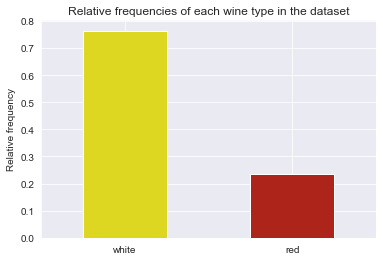

In [56]:
df_join['label'].value_counts(normalize = True).plot(kind = 'bar', rot = 0, color = ["#ded721", "#ad241a"])
plt.title("Relative frequencies of each wine type in the dataset")
plt.ylabel("Relative frequency")
plt.show()

##### ML models

In [52]:
df_join.head(2)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,label,cat_quality
0,7.4,0.70,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red,0
1,7.8,0.88,0.0,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red,0


Cross-validation: [0.7521 0.755  0.7518 0.7575 0.7446]
Mean: 0.7522
Standard deviation: 0.0043
Model      : Logistic Regression
Accuracy   : 0.7418 
Precision  : 0.7364 
Recall     : 0.7418 
F1 - Score : 0.7372 
F1 - Score for class 0: 0.62
F1 - Score for class 1: 0.80
ROC - AUC  : 0.7063 
Cross-validation: [0.6533 0.6905 0.6844 0.6901 0.6571]
Mean: 0.6751
Standard deviation: 0.0164
Model      : Tree classification
Accuracy   : 0.7050 
Precision  : 0.7063 
Recall     : 0.7050 
F1 - Score : 0.7056 
F1 - Score for class 0: 0.60
F1 - Score for class 1: 0.77
ROC - AUC  : 0.6833 
Cross-validation: [0.7536 0.7794 0.7633 0.7475 0.7532]
Mean: 0.7594
Standard deviation: 0.0112
Model      : Random Forest
Accuracy   : 0.7746 
Precision  : 0.7738 
Recall     : 0.7746 
F1 - Score : 0.7742 
F1 - Score for class 0: 0.69
F1 - Score for class 1: 0.82
ROC - AUC  : 0.7546 
Cross-validation: [0.7321 0.7493 0.7504 0.7432 0.7145]
Mean: 0.7379
Standard deviation: 0.0134
Model      : AdaBoost
Accuracy   : 0.7

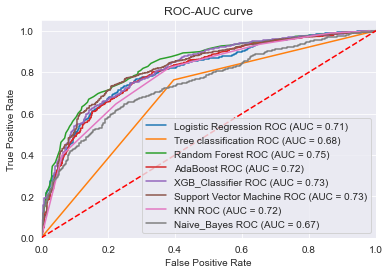

In [53]:
# Testing models
## defining features and target columns
X = df_join.drop(columns=['label', 'quality', 'cat_quality'])
y = df_join['cat_quality']

# testing models
test_models_metrics(X,
                    y,
                    model_list=list_models,
                    col_model_name='model_name',
                    col_model='estimator',
                    cross_validation_split_number = 5,
                    stratify = y,
                    save_fig = True
                   )

**Comments:** Random Forest and Gradient boosting methods will be used to predict wine quality in this joined dataset.

In [55]:
df_join.head(2)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,label,cat_quality
0,7.4,0.70,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red,0
1,7.8,0.88,0.0,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red,0


In [57]:
## defining features and target columns
X = df_join.drop(columns = ['quality', 'label', 'cat_quality']) # all columns except for cat_quality
y = df_join['cat_quality'] # cat_quality columns

## splitting dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify = y)

## scaling dataset
sc = StandardScaler()
X_train[X.columns] = sc.fit_transform(X_train[X.columns])
X_test[X.columns] = sc.transform(X_test[X.columns])

##### Random Forest

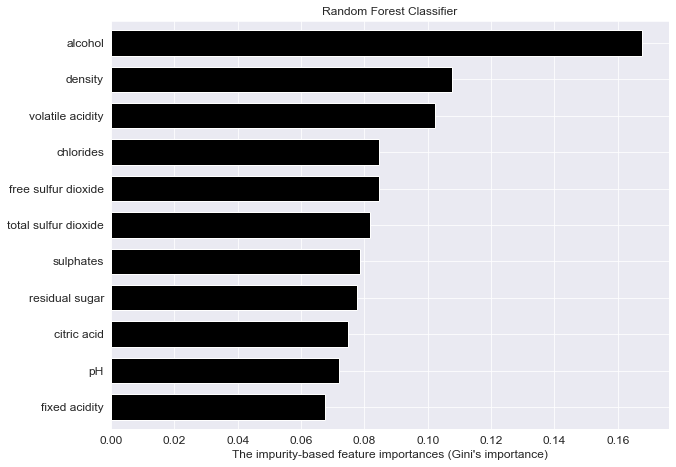

In [70]:
model = RandomForestClassifier(random_state = 42)

# fitting the model
model.fit(X_train, y_train)

# finding coefficients and intercept
feature_importance = model.feature_importances_

# plotting coefficients
table_coeff = pd.DataFrame(data = feature_importance.reshape(-1, 1), columns = ['feature_importance'], index = X.columns).sort_values(by = 'feature_importance')
table_coeff.plot(kind = 'barh', 
                 figsize = (10, 7.5),
                 legend = False,
                 title = 'Random Forest Classifier',
                 width = 0.7,
                 color = 'black',
                 fontsize = 12)
plt.xlabel("The impurity-based feature importances (Gini's importance)", fontsize = 12)
plt.show()

In [59]:
# working out the predictions
y_proba = model.predict_proba(X_test)[:, 1]
results_test = pd.DataFrame(zip(y_test, np.around(y_proba, 3)), columns=['target', 'proba'])
df_results = best_classification_split_score(results_test, threshold_increment=0.02,colum_probabilities='proba')
# table
df_results.sort_values(by=['f1_score', 'recall'], ascending=False).head(5)

0.02 0.04 0.06 0.08 0.1 0.12 0.14 0.16 0.18 0.2 0.22 0.24 0.26 0.28 0.3 0.32 0.34 0.36 0.38 0.4 0.42 0.44 0.46 0.48 0.5 0.52 0.54 0.56 0.58 0.6 0.62 0.64 0.66 0.68 0.7 0.72 0.74 0.76 0.78 0.8 0.82 0.84 0.86 0.88 0.9 0.92 0.94 0.96 0.98 1.0 

,threshold,TN,FN,FP,TP,precision,recall,accuracy,f0_score,f1_score
21,0.44,313,102,230,850,0.7870,0.8929,0.7779,0.6534,0.8366
23,0.48,350,130,193,822,0.8099,0.8634,0.7839,0.6843,0.8358
22,0.46,332,119,211,833,0.7979,0.8750,0.7793,0.6680,0.8347
19,0.40,270,82,273,870,0.7612,0.9139,0.7625,0.6034,0.8305
24,0.50,365,150,178,802,0.8184,0.8424,0.7806,0.6900,0.8302


**Comments:** The threshold of 0.48 will be used since it provides the best combination of precision, recall, accuracy and f1-score

Class report test
               precision    recall  f1-score   support

           0       0.73      0.64      0.68       543
           1       0.81      0.86      0.84       952

    accuracy                           0.78      1495
   macro avg       0.77      0.75      0.76      1495
weighted avg       0.78      0.78      0.78      1495



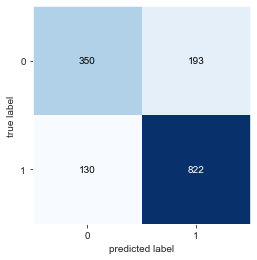

In [60]:
# Cria a resposta com o novo threshold
y_pred = np.where(y_proba >= 0.48, 1, 0)

# metrics
cr_test, cm_test = classification_report(y_test, y_pred), confusion_matrix(y_test, y_pred)
print('Class report test\n', cr_test)
plot_confusion_matrix(cm_test)

plt.show()

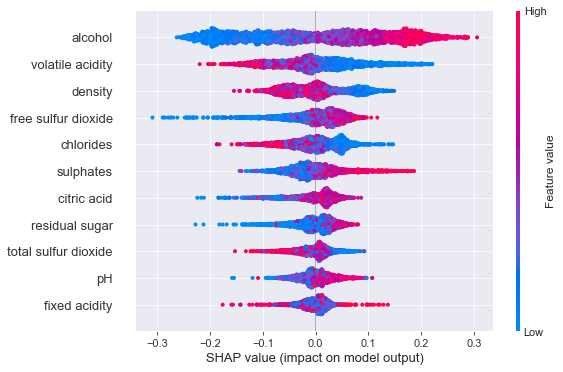

In [61]:
## find explainers
explainer = shap.TreeExplainer(model)
shap_object = explainer(X_train)
shap_values = explainer.shap_values(X_train)
# analysing output == 1 (high-quality wines)
shap.summary_plot(shap_values[1], X_train)

**Comments:** Once more we see the same pattern:
- High alcohol levels explain better classified wines
- Conversely, low volatile acidity and density combines with better classified wines

##### XGBclassifier

[12:12:13] WARNING: D:\bld\xgboost-split_1637426510059\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


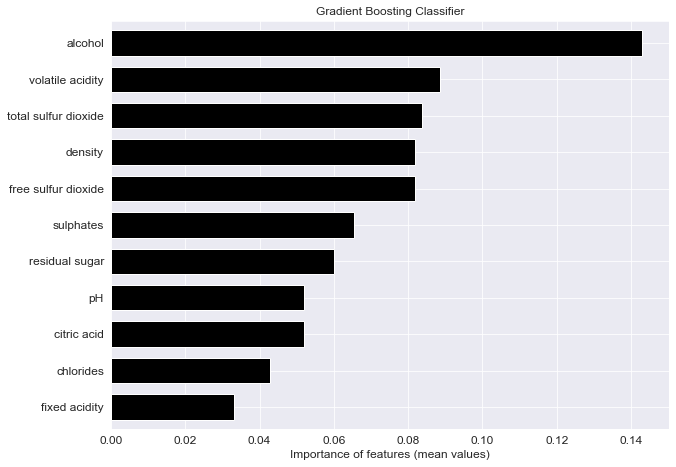

In [71]:
model = XGBClassifier(use_label_encoder=False, random_state = 42)

# fitting the model
model.fit(X_train, y_train)


# finding coefficients and intercept
feature_importance = permutation_importance(model, X_train, y_train)

# plotting coefficients
table_coeff = pd.DataFrame(data = feature_importance.importances_mean.reshape(-1, 1), columns = ['feature_importance'], index = X.columns).sort_values(by = 'feature_importance')
table_coeff.plot(kind = 'barh', 
                 figsize = (10, 7.5),
                 legend = False,
                 title = 'Gradient Boosting Classifier',
                 width = 0.7,
                 color = 'black',
                 fontsize = 12)
plt.xlabel("Importance of features (mean values)", fontsize = 12)
plt.show()

In [64]:
# working out the predictions
y_proba = model.predict_proba(X_test)[:, 1]
results_test = pd.DataFrame(zip(y_test, np.around(y_proba, 3)), columns=['target', 'proba'])
df_results = best_classification_split_score(results_test, threshold_increment=0.02,colum_probabilities='proba')
# table
df_results.sort_values(by=['f1_score', 'recall'], ascending=False).head(10)

0.02 0.04 0.06 0.08 0.1 0.12 0.14 0.16 0.18 0.2 0.22 0.24 0.26 0.28 0.3 0.32 0.34 0.36 0.38 0.4 0.42 0.44 0.46 0.48 0.5 0.52 0.54 0.56 0.58 0.6 0.62 0.64 0.66 0.68 0.7 0.72 0.74 0.76 0.78 0.8 0.82 0.84 0.86 0.88 0.9 0.92 0.94 0.96 0.98 1.0 

,threshold,TN,FN,FP,TP,precision,recall,accuracy,f0_score,f1_score
13,0.28,271,86,272,866,0.7610,0.9097,0.7605,0.6022,0.8287
12,0.26,261,80,282,872,0.7556,0.9160,0.7579,0.5905,0.8281
17,0.36,305,113,238,839,0.7790,0.8813,0.7652,0.6348,0.8270
15,0.32,284,100,259,852,0.7669,0.8950,0.7599,0.6127,0.8260
16,0.34,294,107,249,845,0.7724,0.8876,0.7619,0.6229,0.8260
14,0.30,278,96,265,856,0.7636,0.8992,0.7585,0.6063,0.8259
11,0.24,246,74,297,878,0.7472,0.9223,0.7518,0.5701,0.8256
18,0.38,314,122,229,830,0.7838,0.8718,0.7652,0.6415,0.8255
10,0.22,236,68,307,884,0.7422,0.9286,0.7492,0.5573,0.8250
9,0.20,220,58,323,894,0.7346,0.9391,0.7452,0.5359,0.8243


**Comments:** The threshold of 0.38 will be used since it provides the best combination of precision, recall, accuracy and f1-score

Class report test
               precision    recall  f1-score   support

           0       0.72      0.58      0.64       543
           1       0.78      0.87      0.83       952

    accuracy                           0.77      1495
   macro avg       0.75      0.73      0.73      1495
weighted avg       0.76      0.77      0.76      1495



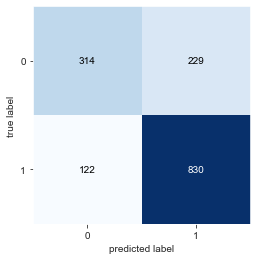

In [67]:
# Cria a resposta com o novo threshold
y_pred = np.where(y_proba >= 0.38, 1, 0)

# metrics
cr_test, cm_test = classification_report(y_test, y_pred), confusion_matrix(y_test, y_pred)
print('Class report test\n', cr_test)
plot_confusion_matrix(cm_test)

plt.show()

 99%|===================| 3459/3487 [00:20<00:00]        

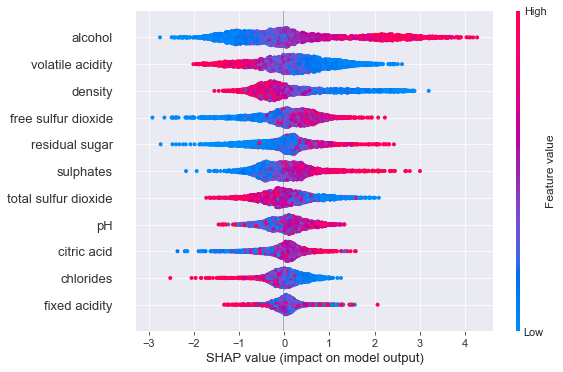

In [72]:
# model
explainer = shap.Explainer(model, X_train)
#shap_object = explainer(X_train)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

### Out of cuiosity, would we be able to separate red and white wines based on physicochemical properties?

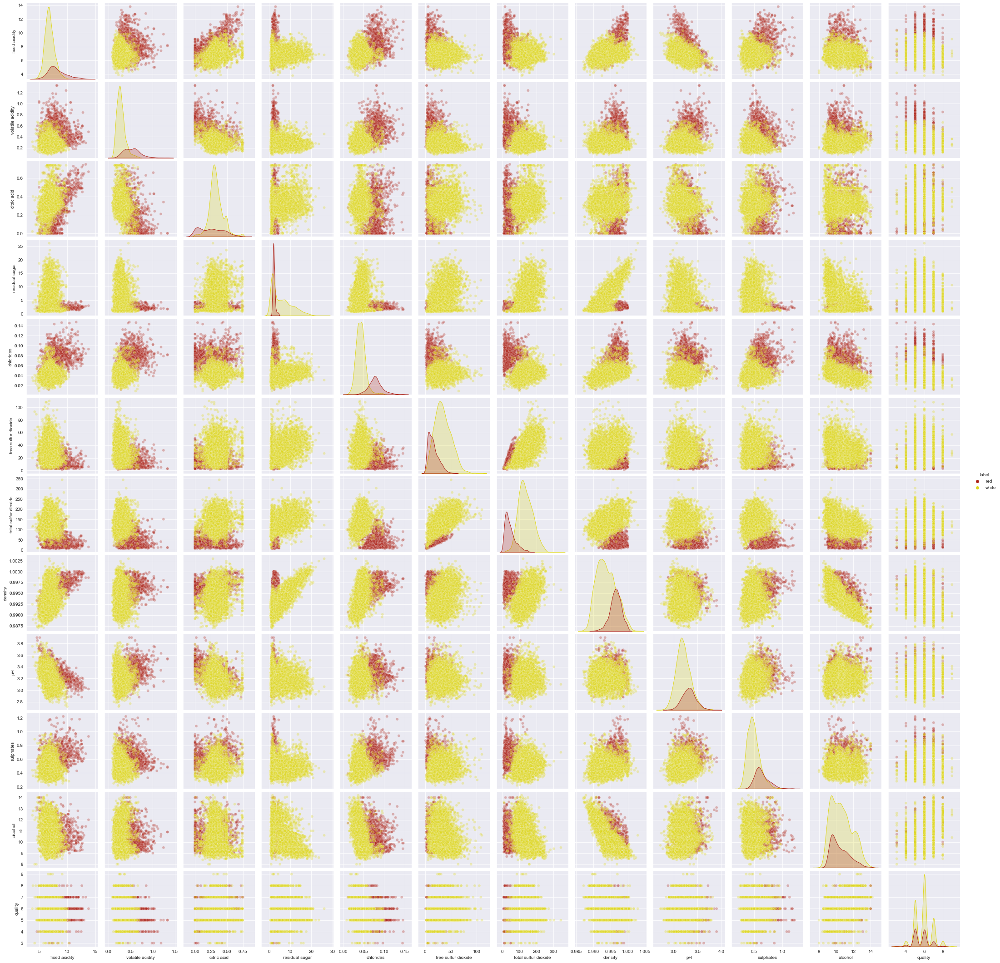

In [34]:
data = df_join[df_join.columns[:-1]]
sns.pairplot(data = data, 
             hue = 'label',
             palette = ["#ad241a", "#ded721"],
             plot_kws={'alpha': 0.3},
             #plot_kws = dict(size = df_join['quality']),
             )
#plt.savefig("pairplot_comparison_red_white.jpg", dpi = 300)
plt.show()

**Comments:** There are several features that seem to separate red wines from whithe wines.

In [76]:
# New column
df_join['binary_label'] = np.where(df_join['label'] == 'red', 0, 1)
df_join

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,label,cat_quality,binary_label
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red,0,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,red,0,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,red,0,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,red,1,0
4,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5,red,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4977,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white,1,1
4978,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white,0,1
4979,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white,1,1
4980,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white,1,1


Cross-validation: [0.9986 0.9971 0.9986 0.9928 0.9943]
Mean: 0.9963
Standard deviation: 0.0023
Model      : Logistic Regression
Accuracy   : 0.9960 
Precision  : 0.9960 
Recall     : 0.9960 
F1 - Score : 0.9960 
F1 - Score for class 0: 0.99
F1 - Score for class 1: 1.00
ROC - AUC  : 0.9944 
Cross-validation: [0.9814 0.9842 0.9842 0.9813 0.9799]
Mean: 0.9822
Standard deviation: 0.0017
Model      : Tree classification
Accuracy   : 0.9839 
Precision  : 0.9840 
Recall     : 0.9839 
F1 - Score : 0.9840 
F1 - Score for class 0: 0.97
F1 - Score for class 1: 0.99
ROC - AUC  : 0.9797 
Cross-validation: [0.9957 0.9957 0.9971 0.99   0.9928]
Mean: 0.9943
Standard deviation: 0.0025
Model      : Random Forest
Accuracy   : 0.9946 
Precision  : 0.9946 
Recall     : 0.9946 
F1 - Score : 0.9946 
F1 - Score for class 0: 0.99
F1 - Score for class 1: 1.00
ROC - AUC  : 0.9926 
Cross-validation: [0.9943 0.9943 0.9943 0.9914 0.9943]
Mean: 0.9937
Standard deviation: 0.0012
Model      : AdaBoost
Accuracy   : 0.9

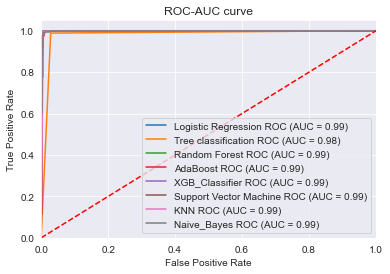

In [78]:
## selecting columns
del1, del2 = np.where(df_join.columns == 'quality'), np.where(df_join.columns == 'cat_quality') # unnecessary columns
col = np.delete(df_join.columns, [del1, del2])

## defining features and target columns
X = df_join.drop(columns=['label', 'quality', 'cat_quality', 'binary_label'])
y = df_join['binary_label']

# testing models
test_models_metrics(X,
                    y,
                    model_list=list_models,
                    col_model_name='model_name',
                    col_model='estimator',
                    cross_validation_split_number = 5,
                    stratify = y,
                    #save_fig = True
                   )

**Comments:** Based on the analysis above, any model used would be a good classifier for wine type.

              precision    recall  f1-score   support

           0       0.97      0.95      0.96       378
           1       0.98      0.99      0.99      1117

    accuracy                           0.98      1495
   macro avg       0.98      0.97      0.97      1495
weighted avg       0.98      0.98      0.98      1495





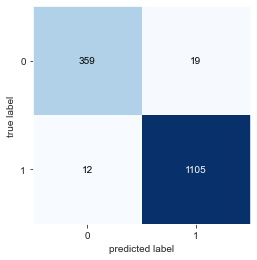

In [79]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model = LogisticRegression(random_state = 42)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print(classification_report(y_test, y_pred))
print('\n')
plot_confusion_matrix(confusion_matrix(y_test, y_pred))
plt.show()

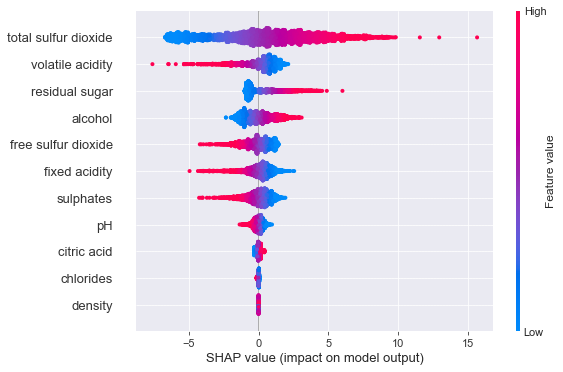

In [80]:
## find explainers
explainer = shap.LinearExplainer(model, X_train)
shap_object = explainer(X_train)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

**Comments:** It's interesting that while alcohol is highly related to wine quality, it's not a very important feature to distinguish between white and red wines, which is also highly expected. Total sulfur dioxide, volatile acidity and residual sugar plays a much relevant role in this matter.
- white wines have higher total sulfur dioxide and residual sugar values but lower volatile acidity values.

---

# Conclusions
- To improve quality prediction, wine were classified as low-quality (scores <= 5) and high-quality (scores > 5).
- Quality of red wines were best predicted by SVC model, which yielded 80% accuracy and with f0 and f1 scores of 0.76 and 0.88, respectively (predict_proba = 0.42).
- Red wines, in turn, were best predicted by Random Forest model, which yielded 79% accuracy and  f0 and f1 scores of 0.64 and 0.90, respectively (predict_proba = 0.48).
- Predictions were improved by setting new cutoff points for decision (predict_proba = 0.42 and 0.48, respectively, for red and white wines).
- It looks that alcohol and volatile density are the most important features when predicting wine quality, which had higher alcohol and lower volatile acidity levels.
- White wines also depended on density (lower values) to be classified as good, while red wines were dependent on suphates and total sulfur dioxide, besides alcohol and volatile acidity, to be classified as a good product.
- Wine-specific physicochemical properties, as expected, define well each type and any model tested was good at distinguisinh between them. Logistic regression model showed that total sulfur dioxide and volatile acidity were strong features at separating them as white wine (class 1) has higher values of the former and lower values of the latter.